## Setup

In [ ]:
import anndata as ad
import crested
import numpy as np
import matplotlib

# Set the font type to ensure text is saved as whole words
matplotlib.rcParams["pdf.fonttype"] = 42  # Use TrueType fonts instead of Type 3 fonts
matplotlib.rcParams["ps.fonttype"] = 42  # For PostScript as well, if needed


## Prepare data

Load genome data

In [ ]:
# Load genome
genome_file = "genome/Nvec_vc1.1_gDNA.fasta"
chrom_sizes = "genome/Nvec_vc1.1_gDNA.chromsizes"
genome = crested.Genome(genome_file, chrom_sizes)

# Register the genome so that it can be used by the package
crested.register_genome(genome)

2025-03-25T13:31:56.345274+0100 INFO Genome Nvec_vc1.1_gDNA registered.


Load AnnData with regions and signal

In [ ]:
# Load data
adata = ad.read_h5ad("results/CREsted/nematostella_broadcelltype_500region_250target_logcount_meansubtract.h5ad")
datamodule = crested.tl.data.AnnDataModule(
    adata,
    batch_size=64,  # lower this if you encounter OOM errors
)

In [12]:
adata.var["split"].value_counts()

split
train    81039
val       4487
test      4335
Name: count, dtype: int64

Load keras model

## Evaluate the model


In [ ]:
# Load an existing model
evaluator = crested.tl.Crested(data=datamodule)
model_path = "results/CREsted/models/meansubstract_deeptopic_broadcelltype_500_logcount_huber_finetuned.keras"

evaluator.load_model(
    model_path,
    compile=True,
)

evaluator.model.compile()

In [14]:
# evaluate the model on the test set
evaluator.test()

68/68 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - concordance_correlation_coefficient: 0.3318 - cosine_similarity: 0.3397 - loss: 0.2612 - mean_absolute_error: 0.5555 - mean_squared_error: 0.5108 - pearson_correlation: 0.4200 - pearson_correlation_log: nan - zero_penalty_metric: 0.4278
2025-03-25T13:33:56.500918+0100 INFO Test concordance_correlation_coefficient: 0.3333
2025-03-25T13:33:56.501771+0100 INFO Test cosine_similarity: 0.3396
2025-03-25T13:33:56.502509+0100 INFO Test loss: 0.2654
2025-03-25T13:33:56.503234+0100 INFO Test mean_absolute_error: 0.5607
2025-03-25T13:33:56.503955+0100 INFO Test mean_squared_error: 0.5217
2025-03-25T13:33:56.504661+0100 INFO Test pearson_correlation: 0.4203
2025-03-25T13:33:56.505367+0100 INFO Test pearson_correlation_log: nan
2025-03-25T13:33:56.506082+0100 INFO Test zero_penalty_metric: 2.2935


## Predict

Since crested is build around making predictions over genomic sequences, this can accept as input:
- (lists of) sequence(s)
- (lists of) genomic region name(s)
- one hot encoded sequences of shape (N, L, 4)

    anndata objects with regions as its .var index


In [ ]:
import keras

# load a trained model
model_path = "results/CREsted/models/meansubstract_deeptopic_broadcelltype_500_logcount_huber.keras"
model = keras.models.load_model(
    model_path, compile=False
)

# store model predictions for all regions in the anndata object
predictions = crested.tl.predict(adata, model)
adata.layers["model"] = predictions.T  # adata expects (C, N) instead of (N, C)

# load a trained finetuned model
model_path = "results/CREsted/models/meansubstract_deeptopic_broadcelltype_500_logcount_huber_finetuned.keras"
model_ft = keras.models.load_model(
    model_path, compile=False
)

# store finetuned model predictions for all regions in the anndata object
predictions = crested.tl.predict(adata, model_ft)
adata.layers["model_ft"] = predictions.T  # adata expects (C, N) instead of (N, C)

2809/2809 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step
2809/2809 ━━━━━━━━━━━━━━━━━━━━ 19s 7ms/step


## Inspect predictions

### Across regions

Prediction to ground truth correlation across regions (peaks)

In [74]:
from scipy.stats import pearsonr

def reg_region(adata, split="test", predictions="model_ft"):
    # Get indices of test regions
    split_mask = adata.var["split"] == split

    # Subset predictions and true values
    y_preds = adata.layers[predictions][:, split_mask].T
    y_true = adata.X[:, split_mask].T

    # Calculate correlation for each test region
    return np.array([pearsonr(y_true[i], y_preds[i])[0] for i in range(y_true.shape[0])])


In [75]:
reg_cor_base = reg_region(adata, split="test", predictions="model")
reg_cor_ftnd = reg_region(adata, split="test", predictions="model_ft")

/tmp/7102807/ipykernel_3854135/680738803.py:12: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  return np.array([pearsonr(y_true[i], y_preds[i])[0] for i in range(y_true.shape[0])])


In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np

data = [reg_cor_base, reg_cor_ftnd]
labels = ["Base Model", "Fine-Tuned Model"]

# Create figure and axis
fig, ax = plt.subplots(figsize=(4, 4))

# Boxplot
box = plt.boxplot(data, tick_labels=labels)

# Labels & Title
plt.ylabel("Pearson Correlation Coefficient")

# Show plot
plt.grid(True, linestyle="--", alpha=0.5)

plt.show()

In [78]:
np.mean(reg_cor_ftnd - reg_cor_base)
np.mean(reg_cor_ftnd > 0.5)

np.float64(0.3643034209221616)

### Across classes

Prediction to ground truth correlation across classes

In [ ]:
import os
plot_dir = os.path.join("plots", "CREsted", "meansubstract_deeptopic_broadcelltype_500_logcount_huber_finetuned")
os.makedirs(plot_dir, exist_ok=True)

import numpy as np
from scipy.stats import pearsonr, spearmanr

def reg_class(adata, split="test", predictions="model_ft", metric="pearson"):
    # Get indices of test regions
    split_mask = adata.var["split"].isin(split)

    # Subset predictions and true values
    y_preds = adata.layers[predictions][:, split_mask]
    y_true = adata.X[:, split_mask]
    
    # Convert sparse matrix to dense if necessary
    if hasattr(y_true, "toarray"):
        y_true = y_true.toarray()

    if metric == "pearson":
        return np.array([pearsonr(y_true[i], y_preds[i])[0] for i in range(y_true.shape[0])])

    elif metric == "spearman":
        return np.array([spearmanr(y_true[i], y_preds[i])[0] for i in range(y_true.shape[0])])

    elif metric == "rmse":
        return np.sqrt(np.mean((y_preds - y_true) ** 2, axis=1))

    elif metric == "mae":
        return np.mean(np.abs(y_preds - y_true), axis=1)

    elif metric == "mape":
        return np.mean(np.abs((y_true - y_preds) / y_true), axis=1) * 100

    elif metric == "r2":
        ss_total = np.sum((y_true - np.mean(y_true, axis=1, keepdims=True))**2, axis=1)
        ss_residual = np.sum((y_true - y_preds)**2, axis=1)
        return 1 - (ss_residual / ss_total)

    elif metric == "explained_variance":
        return 1 - (np.var(y_true - y_preds, axis=1) / np.var(y_true, axis=1))

    elif metric == "msle":
        return np.mean((np.log1p(y_true) - np.log1p(y_preds))**2, axis=1)

    else:
        raise ValueError(f"Unknown metric: {metric}")


Plot performance metrics across cell types:

 - Pearson correlation
 - Root Mean Squared Error (RMSE): interpretable metric in the same unit as the predicted variable
 - R² Score (Coefficient of Determination): measures how well the model explains variance in the data

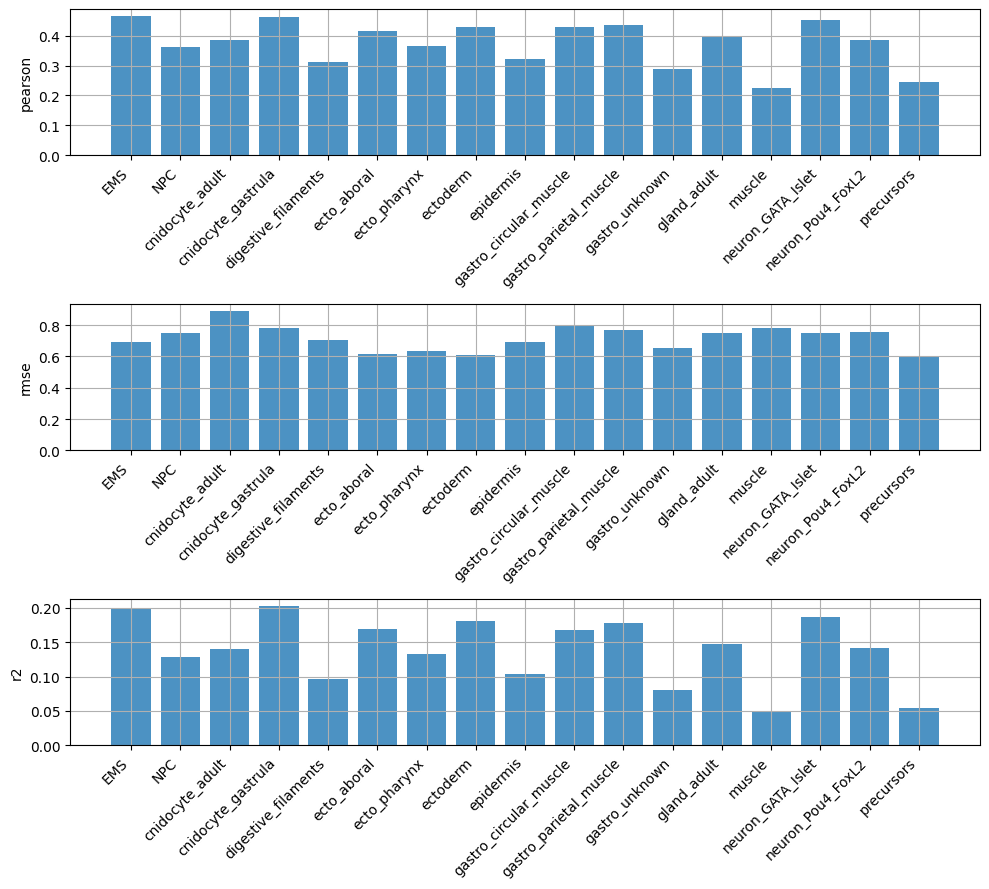

In [33]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pyplot as plt

metrics = ["pearson", "rmse", "r2"]
metrics_dict = {}

# Compute metrics
for metric in metrics:
    metrics_dict[metric] = reg_class(adata, split=['test'], predictions="model", metric=metric)

n_metrics = len(metrics_dict)

# Set up subplots
fig, axes = plt.subplots(
    n_metrics,
    1,
    figsize=(10, 3 * n_metrics),
    sharex=False,
)

# If there's only one metric, make axes a list
if n_metrics == 1:
    axes = [axes]

# Plot metrics
for ax, (metric, y) in zip(axes, metrics_dict.items()):
    ax.bar(list(adata.obs_names), y, alpha=0.8, label=metric)
    ax.set_ylabel(metric)
    ax.grid(True)
    x_indices = np.arange(len(adata.obs_names))
    ax.set_xticks(x_indices)
    ax.set_xticklabels(list(adata.obs_names), rotation=45, ha="right")

plt.tight_layout()
plt.savefig(os.path.join(plot_dir, "prediction-test-metrics.pdf"), format="pdf", bbox_inches="tight")


In [76]:
import pandas as pd 

# Get indices of test regions
split_mask = adata.var["split"].isin(['test'])

# Subset predictions and true values
y_preds = adata.layers['model'][:, split_mask]
y_true = adata.X[:, split_mask]

regions = adata.var.index[split_mask].tolist()
classes = adata.obs.index.tolist()

y_true_pd = pd.DataFrame(y_true.T, columns = classes, index = regions)
y_preds_pd = pd.DataFrame(y_preds.T, columns = classes, index = regions)

y_true_pd = pd.melt(y_true_pd.reset_index(), id_vars='index', var_name = "class", value_name = "true")
y_preds_pd = pd.melt(y_preds_pd.reset_index(), id_vars='index', var_name = "class", value_name = "prediction")

y_true_pd.set_index(["index", "class"], inplace = True)
y_preds_pd.set_index(["index", "class"], inplace = True)

preds_df = y_preds_pd.join(y_true_pd, on = ["index", "class"], how = "outer")
preds_df.to_csv(os.path.join(plot_dir, "prediction-test.tsv"), sep = "\t")

In [ ]:
splits = adata.var["split"]

preds_df.to_csv(os.path.join(plot_dir, "prediction-true.tsv"), sep = "\t")

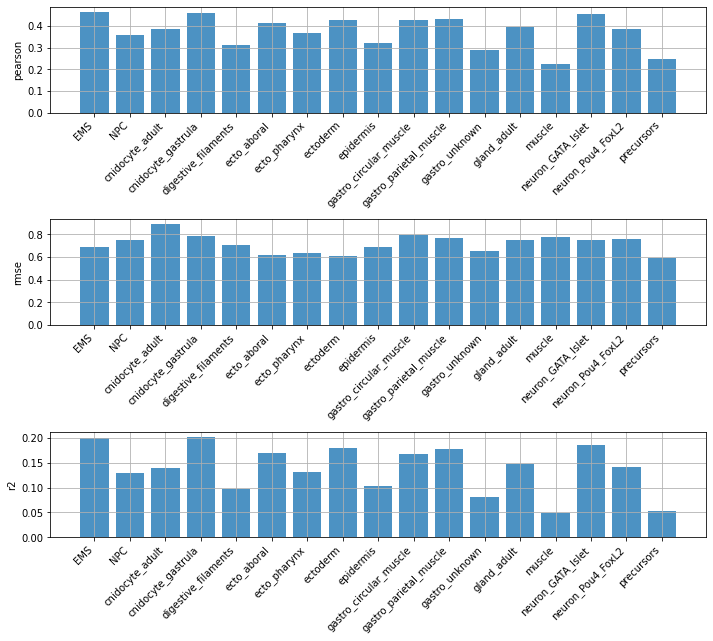

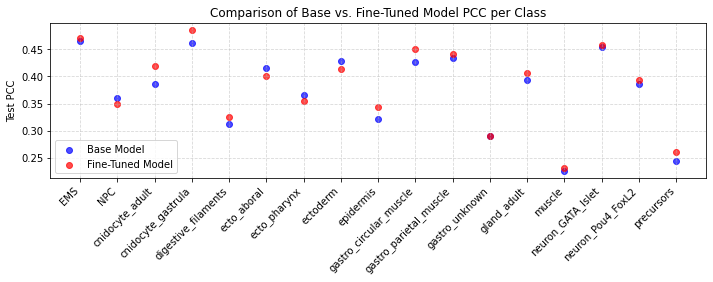

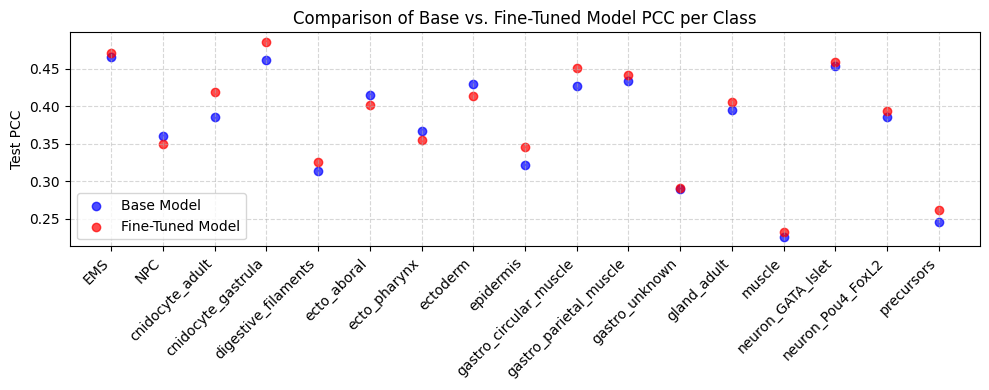

In [23]:
%matplotlib inline
import os
import numpy as np
import matplotlib.pyplot as plt

base_model_pcc = reg_class(adata, split="test", predictions="model", metric="pearson")
ftnd_model_pcc = reg_class(adata, split="test", predictions="model_ft", metric="pearson")

# Get sample names (assuming they represent different classes)
sample_names = list(adata.obs_names)
x_indices = np.arange(len(sample_names))  # Numeric x-axis positions

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 4))

# Scatter plot for both models
ax.scatter(x_indices, base_model_pcc, color="blue", alpha=0.7, label="Base Model")
ax.scatter(x_indices, ftnd_model_pcc, color="red", alpha=0.7, label="Fine-Tuned Model")

# Customize plot
ax.set_ylabel("Test PCC")
ax.set_title("Comparison of Base vs. Fine-Tuned Model PCC per Class")
ax.legend()
ax.grid(True, linestyle="--", alpha=0.5)
ax.set_xticks(x_indices)
ax.set_xticklabels(sample_names, rotation=45, ha="right")

plt.tight_layout()
plt.savefig(os.path.join(plot_dir, "prediction-test-PCC.pdf"), format="pdf", bbox_inches="tight")


Check the correlation of model predictions and ground truth peak heights between all classes.

2025-02-25T19:50:39.932659+0100 INFO Plotting heatmap correlations for split: test, models: ['model', 'model_ft']


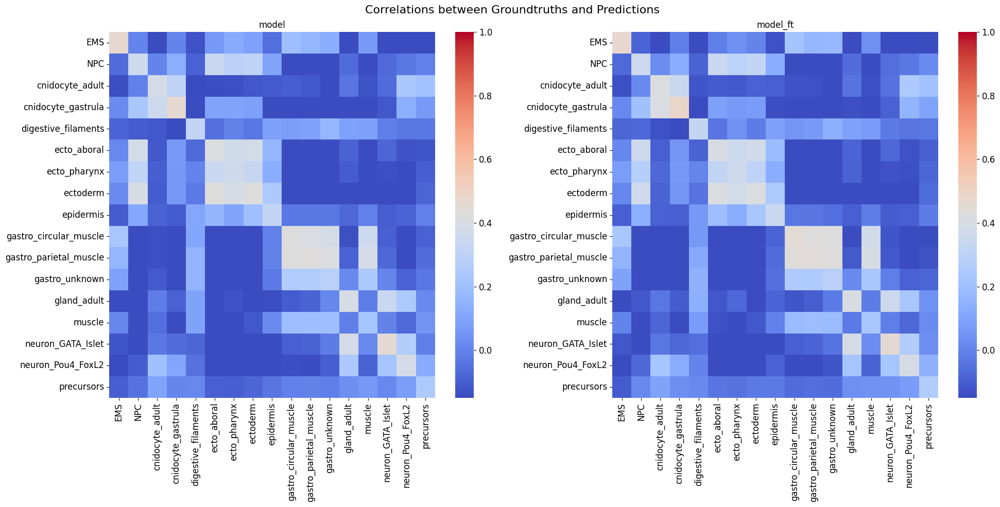

In [60]:
%matplotlib inline
crested.pl.heatmap.correlations_predictions(
    adata,
    split="test",
    title="Correlations between Groundtruths and Predictions",
    x_label_rotation=90,
    width=20,
    height=10,
    log_transform=False,
    vmax=1,
    vmin=-0.15,
    save_path = os.path.join(plot_dir, "prediction-groundtruth-heatmap.pdf")
)

 If peaks between cell types are correlated, then it is expected that predictions from non-matching classes for correlationg cell types will also be high.

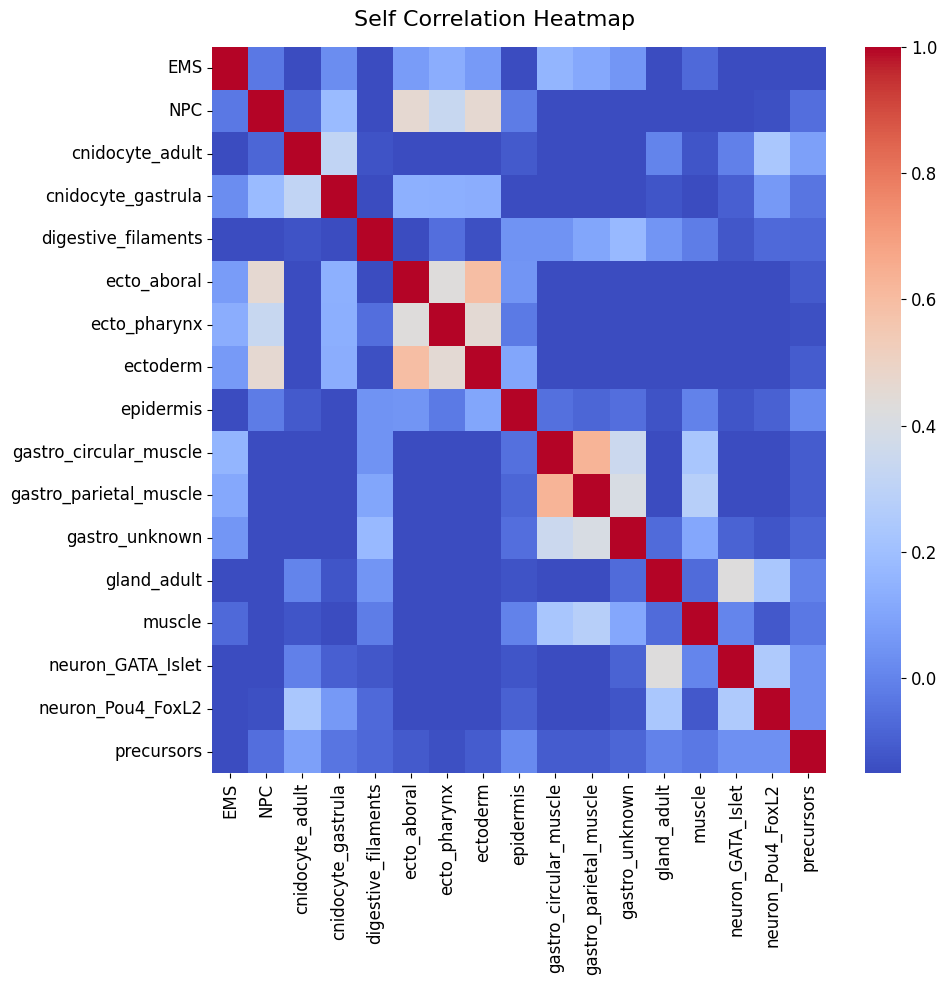

In [61]:
crested.pl.heatmap.correlations_self(
    adata,
    title="Self Correlation Heatmap",
    x_label_rotation=90,
    width=10,
    height=10,
    vmax=1,
    vmin=-0.15,
    save_path = os.path.join(plot_dir, "self-correlation.pdf")
)

Correlation for individual classes

2025-02-25T19:51:22.720779+0100 INFO Plotting density scatter for class: cnidocyte_adult, models: ['model', 'model_ft'], split: test


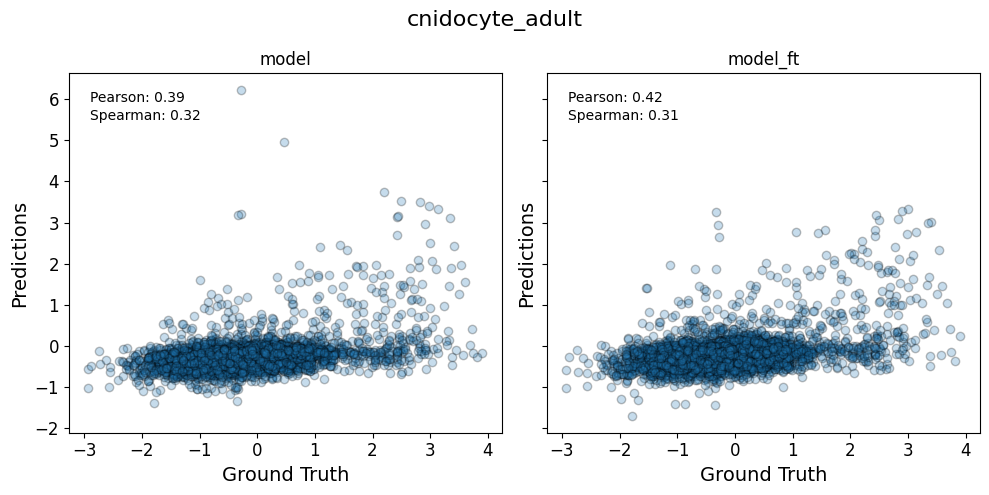

2025-02-25T19:51:23.314240+0100 INFO Plotting density scatter for class: EMS, models: ['model', 'model_ft'], split: test


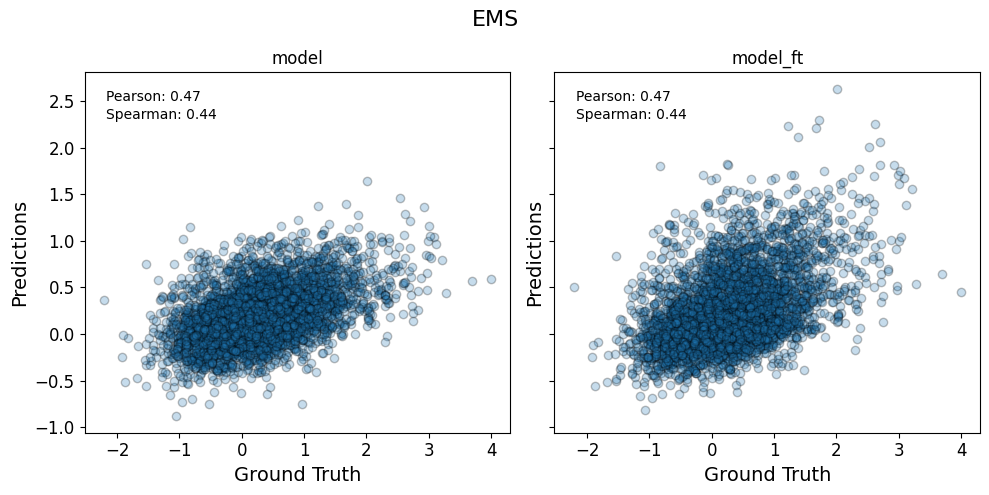

2025-02-25T19:51:23.728522+0100 INFO Plotting density scatter for class: neuron_GATA_Islet, models: ['model', 'model_ft'], split: test


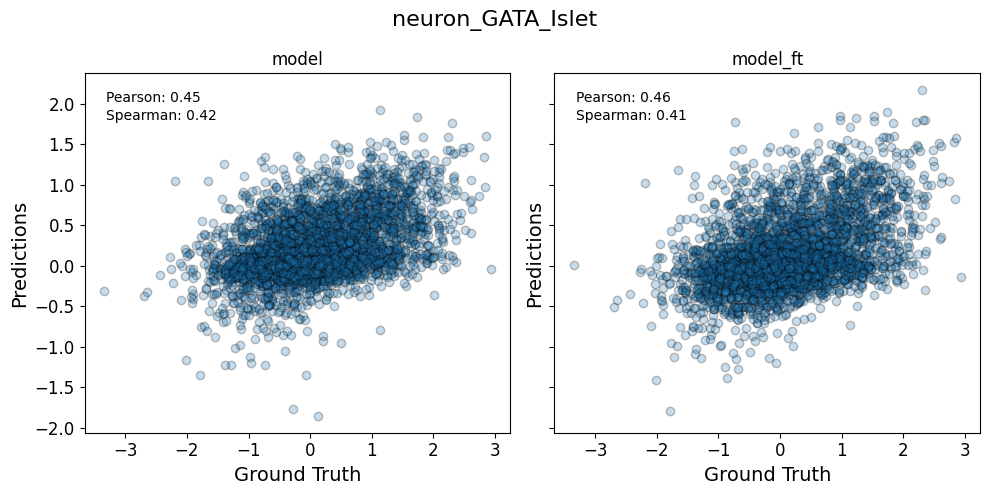

In [62]:
for classn in ["cnidocyte_adult", "EMS", "neuron_GATA_Islet"]:     
    crested.pl.scatter.class_density(
        adata,
        class_name=classn,
        split="test",
        log_transform=False,
        width=10,
        height=5,
        save_path = os.path.join(plot_dir, f"{classn}-prediction-groundtruth-correlation.pdf")
    )

## Example muscle regions

Here we inspect contribution scores around retractor muscle-specific peaks.

In [ ]:
import keras 
model_path = "results/CREsted/models/meansubstract_deeptopic_celltype_500_logcount_huber_finetuned.keras"
model = keras.models.load_model(
    model_path, compile=False
)

import os
plot_dir = os.path.join("plots", "CREsted", "meansubstract_deeptopic_celltype_500_logcount_huber_finetuned")
os.makedirs(plot_dir, exist_ok=True)

#### 1) TR muscle speific Nem64

Nem64 is a bHLH TF that has been shown to be specifically expressed and accessible in tentacle retractor (TR) muscle.

First we look at model prediction on gene locus.

In [11]:
gene = "Nvec_vc1.1_XM_001634938.2"
gene_name = "Nem64"
chrom = "NC_064035.1"
start = 3244926
end = 3245300

cell_type = "muscle_tentacle_retractor"
class_idx = list(adata.obs_names).index(cell_type)

upstream=5000
downstream=5000

strand= '-'

scores, coordinates, min_loc, max_loc, tss_position = crested.tl.score_gene_locus(
    chr_name=chrom,
    gene_start=start,
    gene_end=end,
    target_idx=class_idx,
    model=model,
    strand=strand,
    upstream=upstream,
    downstream=downstream,
    step_size=1,
)

309/309 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


In [ ]:
bigwig = "results/CREsted/bw/"+cell_type+".bw"

values = crested.utils.read_bigwig_region(bigwig, (chrom,start-upstream,end+downstream)) if strand =='+' else crested.utils.read_bigwig_region(bigwig, (chrom,start-downstream,end+upstream))
bw_values=values[0]
midpoints=values[1]

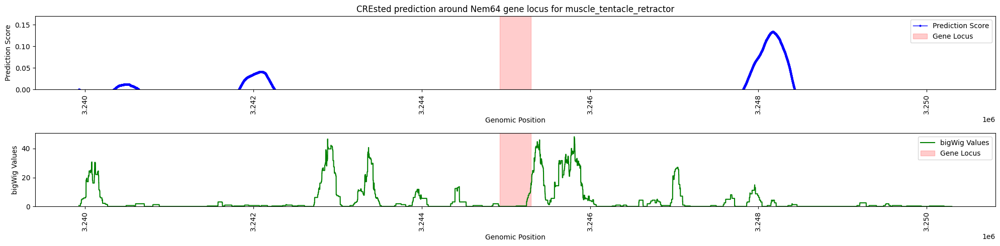

In [15]:
%matplotlib inline
crested.pl.hist.locus_scoring(
    scores,
    (min_loc, max_loc),
    gene_start=start,
    gene_end=end,
    title=f"CREsted prediction around {gene_name} gene locus for {cell_type}",
    bigwig_values=bw_values,
    bigwig_midpoints=midpoints,
    grid=False,
    figsize=(20,5),
    marker_size=2,
    line_width=1,
    save_path = os.path.join(plot_dir, f"{gene_name}-prediction-{cell_type}-gene-locus.pdf")
)

Next, we will calculate contribution scores for peaks around this gene. First we identify regions that have been assigned to the gene.

In [ ]:
import pandas as pd

# Load region-to-gene assignment and preprocess
asgn = pd.read_csv("results/CREsted/Peaks_cell_type_mapped_gene_assignment_coaccess.tsv.gz", sep="\t")
gasn = asgn.loc[asgn["gene"] == gene, :].copy()
gasn["mid"] = (gasn["start"] + gasn["end"]) / 2
gasn.rename(columns={gasn.columns[0]: "chr"}, inplace=True)

# Compute midpoints for model regions
adata.var["mid"] = (adata.var["start"] + adata.var["end"]) / 2

# Ensure chromosome names match types
gasn["chr"] = gasn["chr"].astype(str)
adata.var["chr"] = adata.var["chr"].astype(str)

# Merge and find overlaps
merged = adata.var.merge(gasn, on="chr", suffixes=("_model", "_gasn"))
overlapping_regions = merged[
    (merged["start_model"] <= merged["end_gasn"]) & 
    (merged["end_model"] >= merged["start_gasn"])
].copy()

# Create region identifiers
overlapping_regions["region_id"] = overlapping_regions.apply(
    lambda row: f"{row['chr']}:{row['start_model']}-{row['end_model']}", axis=1
)

# Cell types we want to show
classes_of_interest = ["muscle_tentacle_retractor", "muscle_mesentery_retractor", "gastro_circular_muscle_1", "gastro_parietal_muscle"]
class_idx = list(adata.obs_names.get_indexer(classes_of_interest))


Calculate the contribution scores for sequences of interest 

2025-02-24T13:53:20.523060+0100 INFO Plotting bar plots for region: NC_064035.1:3242615-3243115, models: ['model_500', 'model_500_ft']


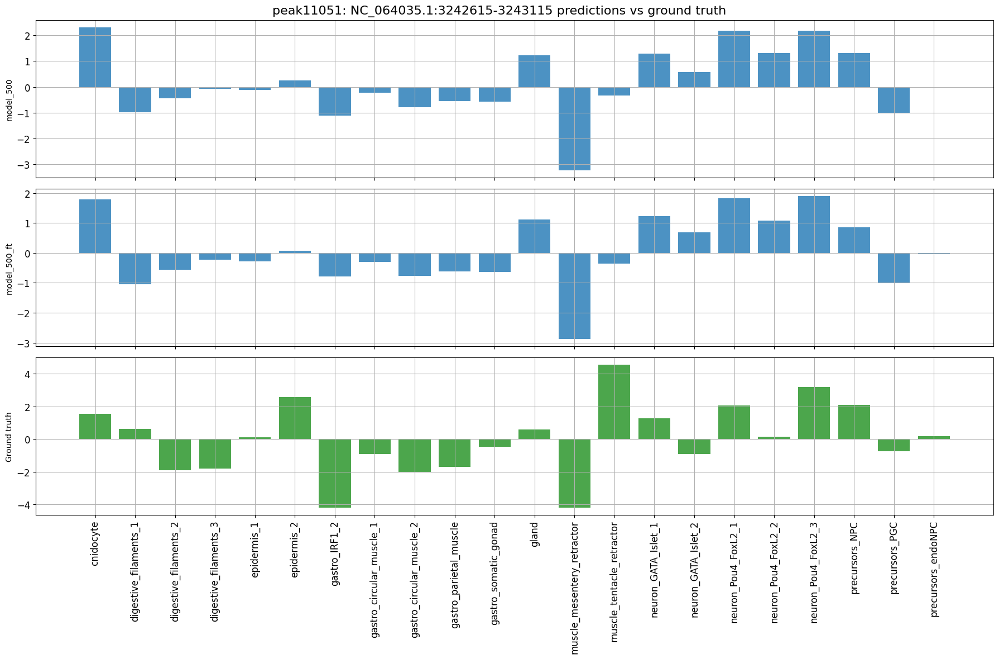

2025-02-24T13:53:21.097154+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:01<00:00,  1.89s/it]


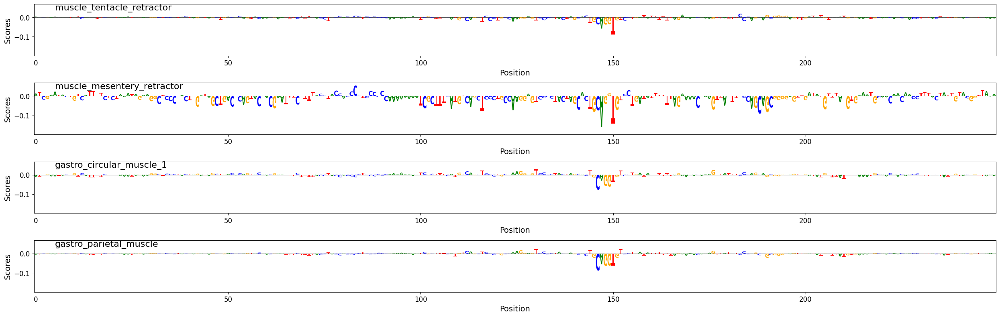

2025-02-24T13:53:28.534422+0100 INFO Plotting bar plots for region: NC_064035.1:3243112-3243612, models: ['model_500', 'model_500_ft']


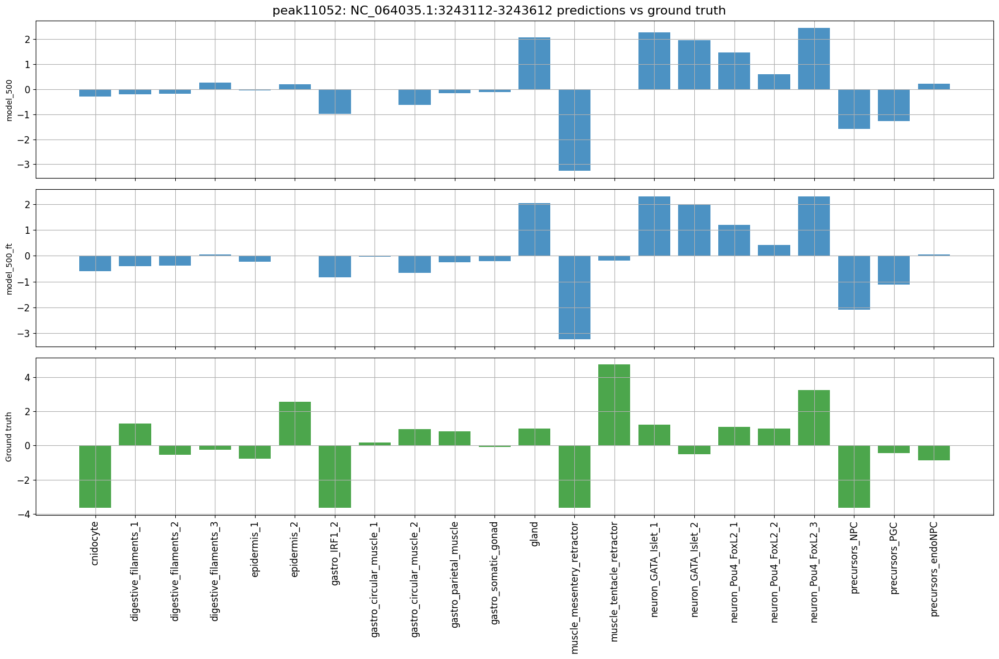

2025-02-24T13:53:29.435861+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


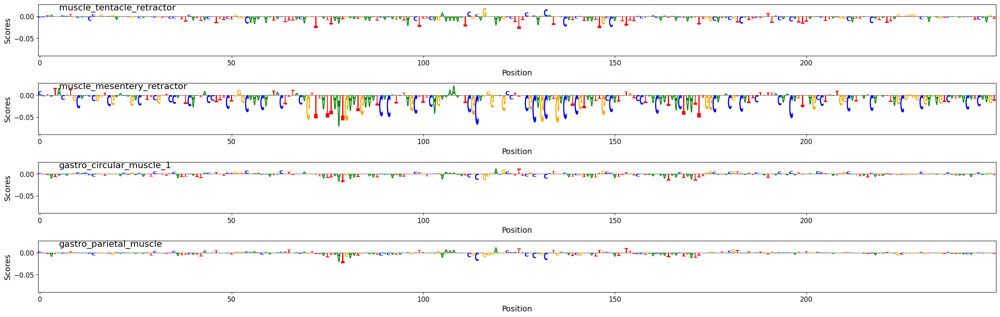

2025-02-24T13:53:36.582097+0100 INFO Plotting bar plots for region: NC_064035.1:3243696-3244196, models: ['model_500', 'model_500_ft']


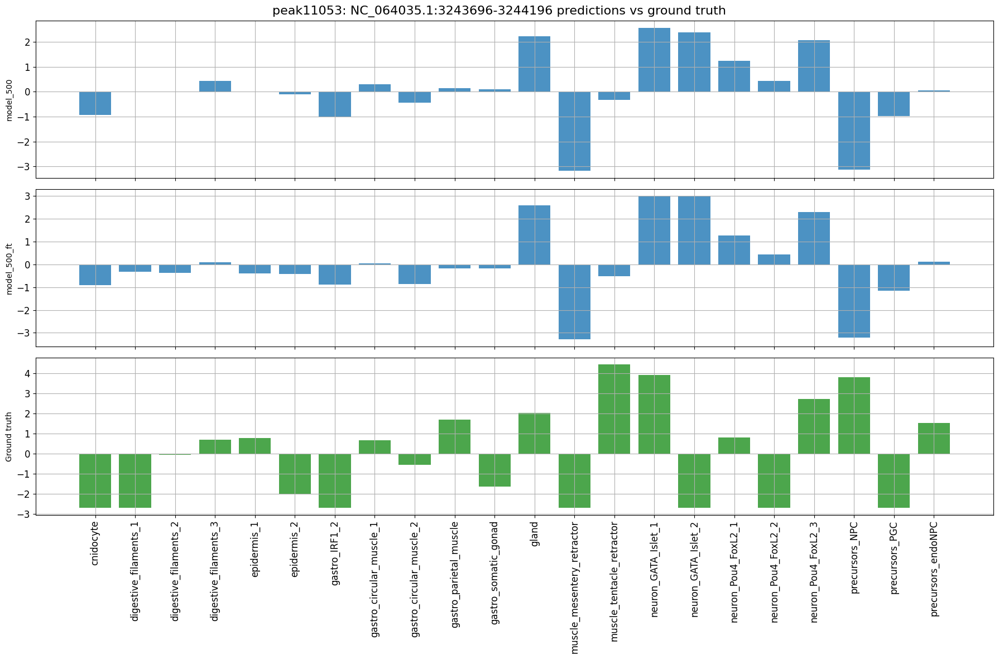

2025-02-24T13:53:37.225008+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:01<00:00,  1.79s/it]


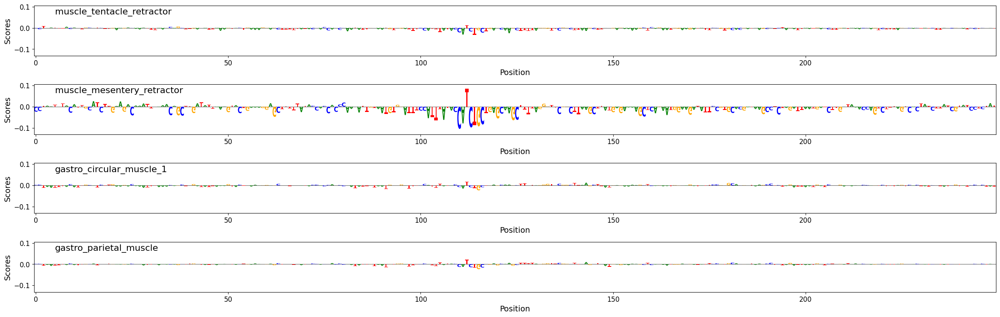

2025-02-24T13:53:44.045543+0100 INFO Plotting bar plots for region: NC_064035.1:3244580-3245080, models: ['model_500', 'model_500_ft']


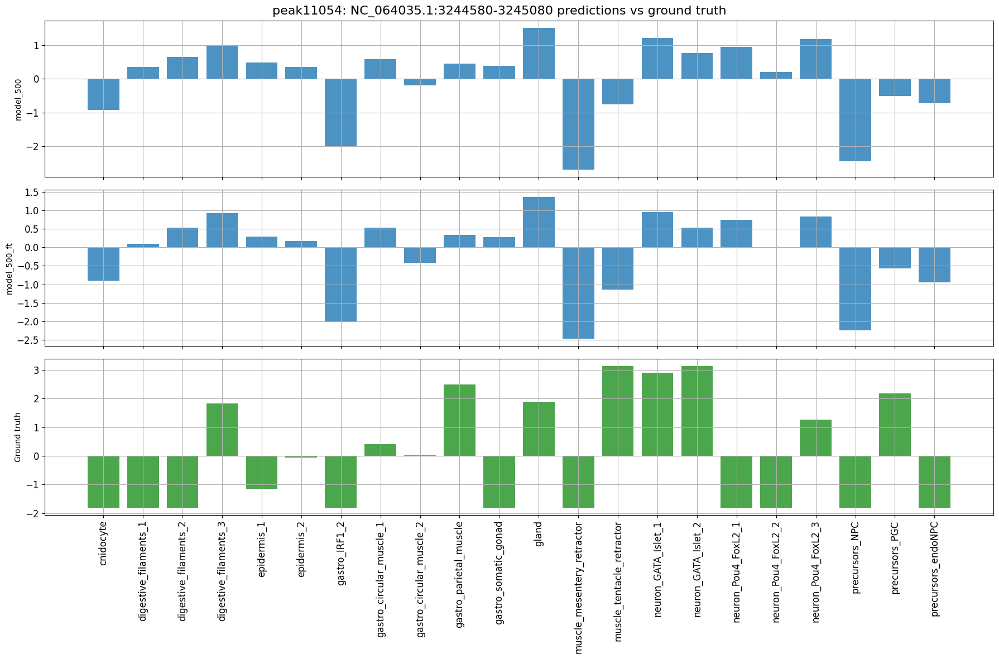

2025-02-24T13:53:44.704510+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


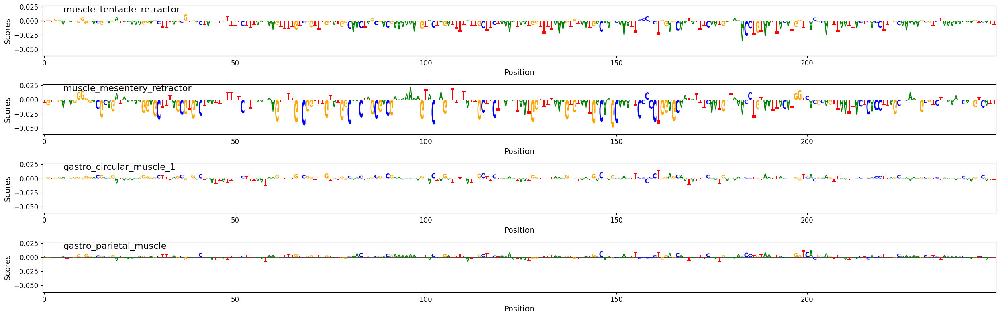

2025-02-24T13:53:51.382549+0100 INFO Plotting bar plots for region: NC_064035.1:3245129-3245629, models: ['model_500', 'model_500_ft']


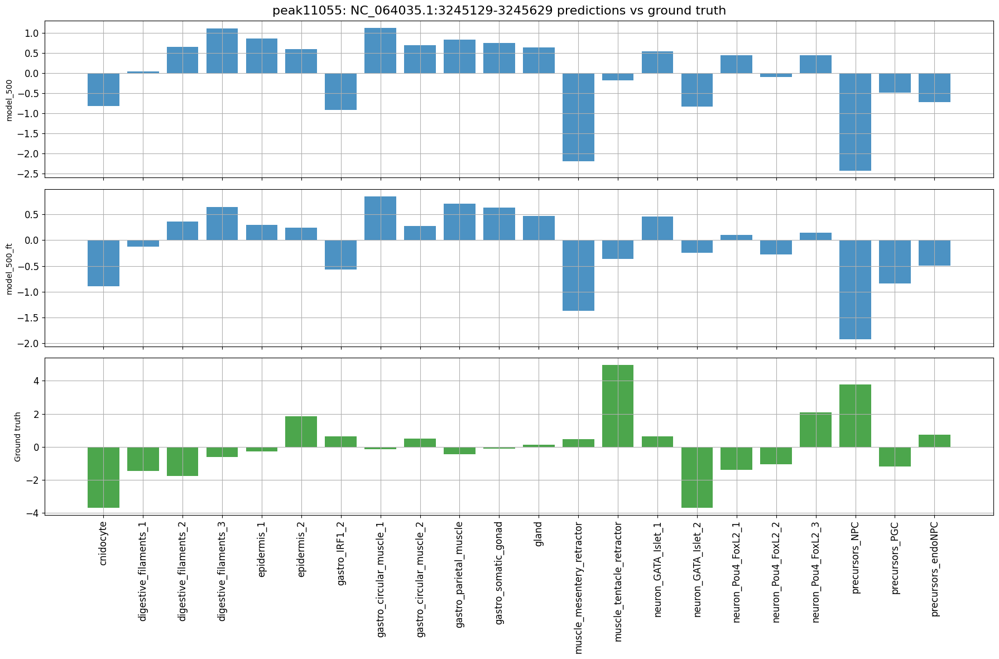

2025-02-24T13:53:52.427424+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:01<00:00,  1.83s/it]


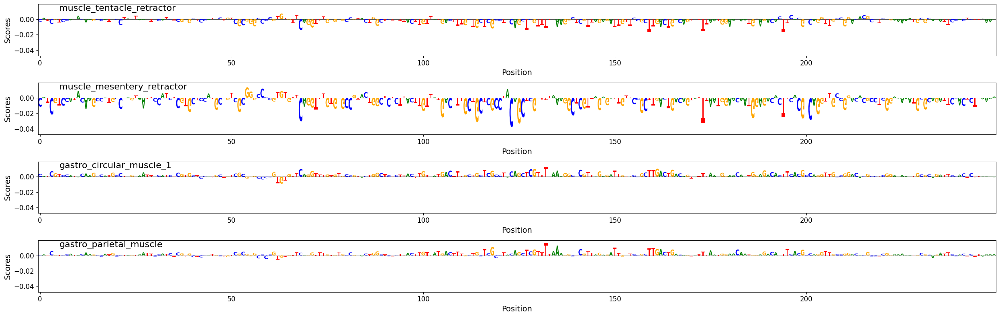

2025-02-24T13:53:59.683204+0100 INFO Plotting bar plots for region: NC_064035.1:3245545-3246045, models: ['model_500', 'model_500_ft']


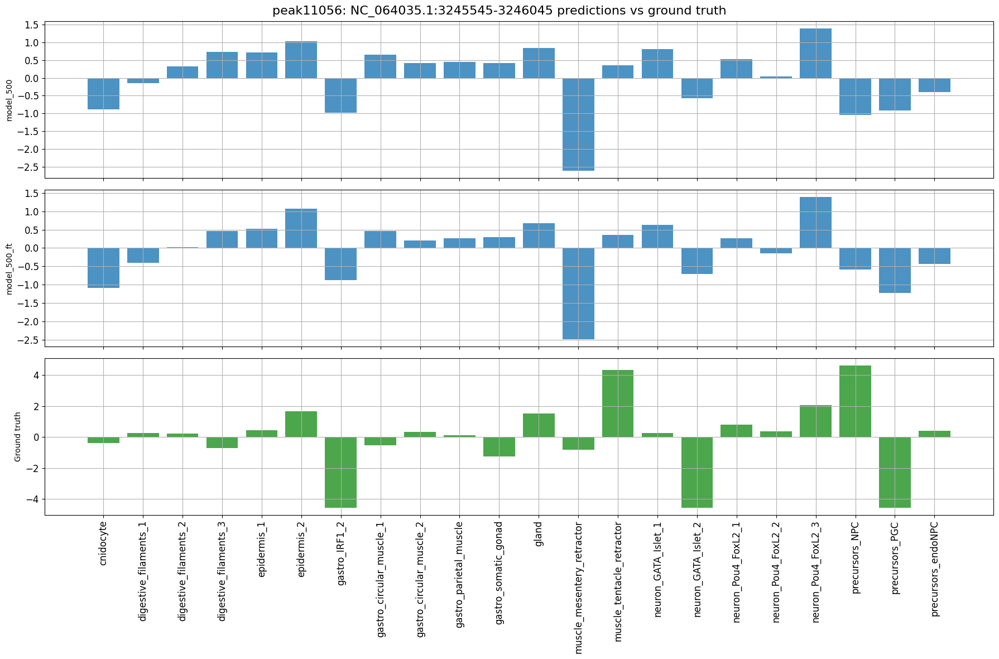

2025-02-24T13:54:00.362567+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


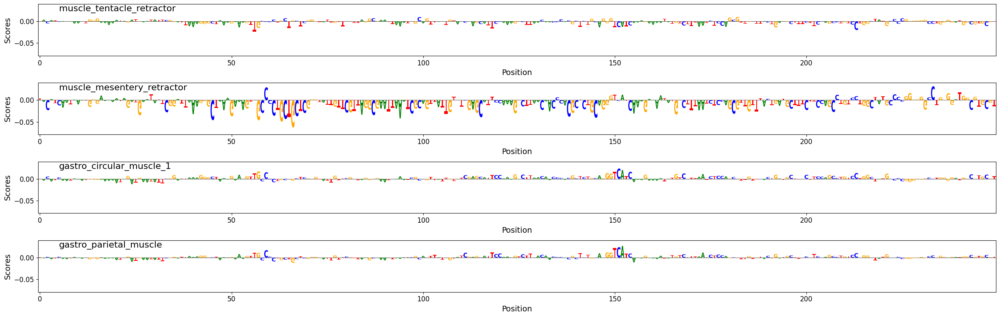

2025-02-24T13:54:08.015805+0100 INFO Plotting bar plots for region: NC_064035.1:3245545-3246045, models: ['model_500', 'model_500_ft']


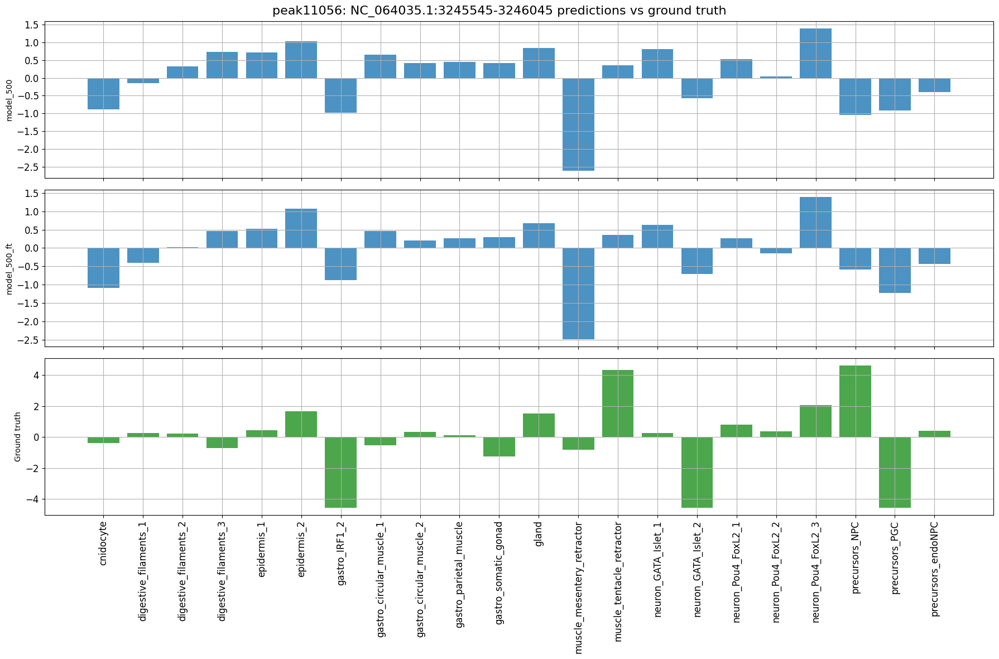

2025-02-24T13:54:08.683091+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


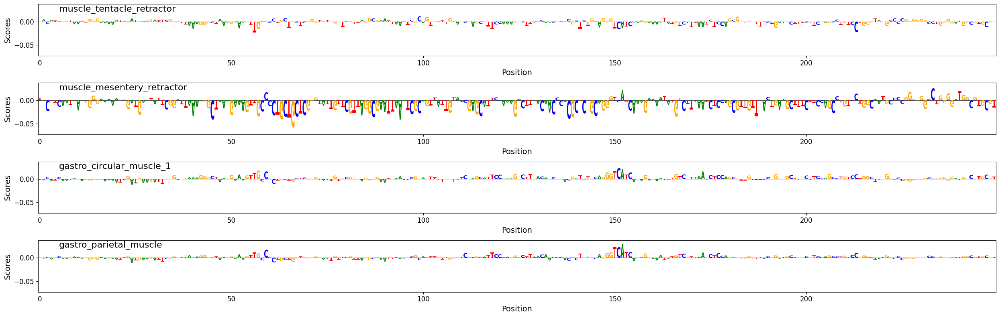

2025-02-24T13:54:16.084658+0100 INFO Plotting bar plots for region: NC_064035.1:3246584-3247084, models: ['model_500', 'model_500_ft']


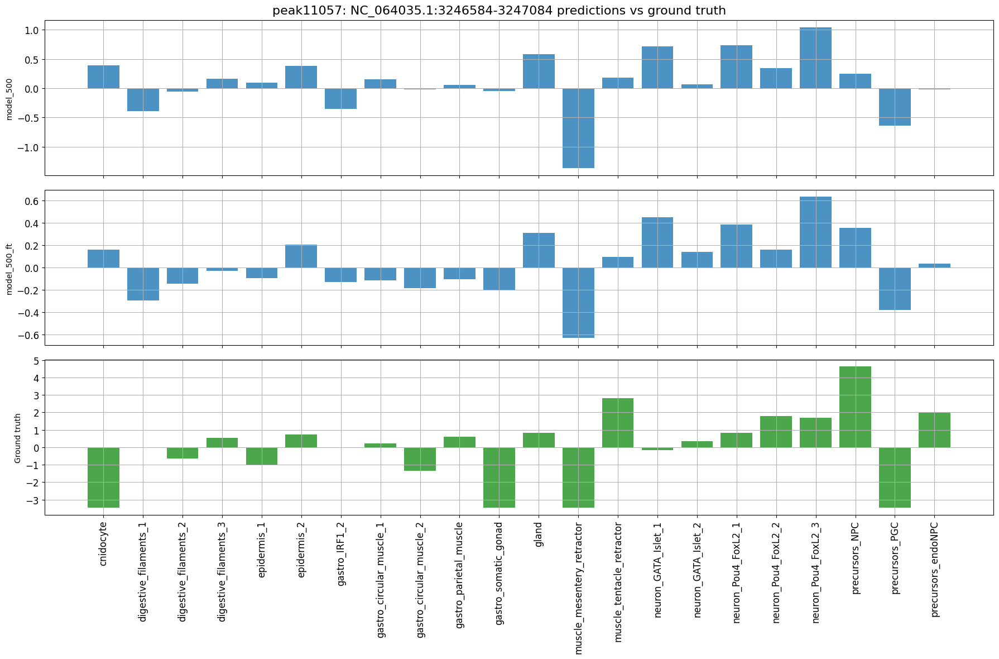

2025-02-24T13:54:16.742372+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


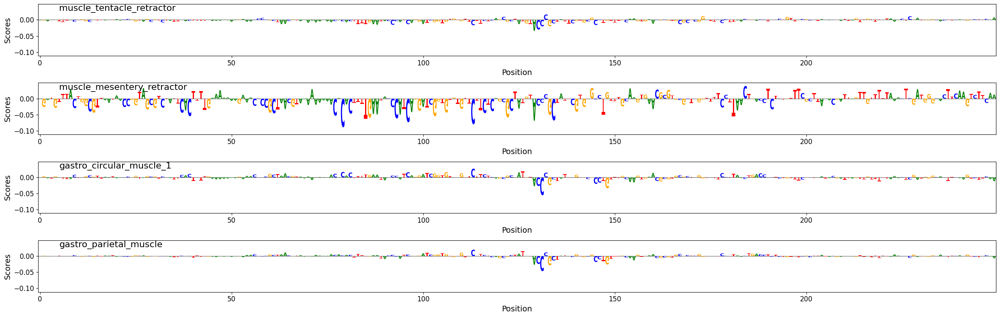

2025-02-24T13:54:24.426150+0100 INFO Plotting bar plots for region: NC_064035.1:3246584-3247084, models: ['model_500', 'model_500_ft']


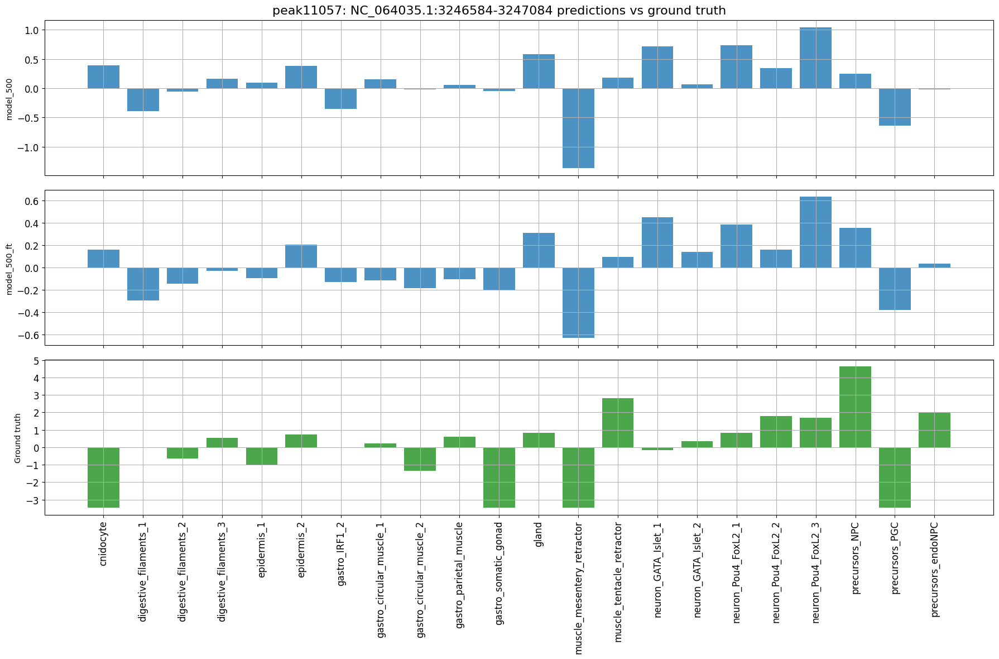

2025-02-24T13:54:25.039905+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


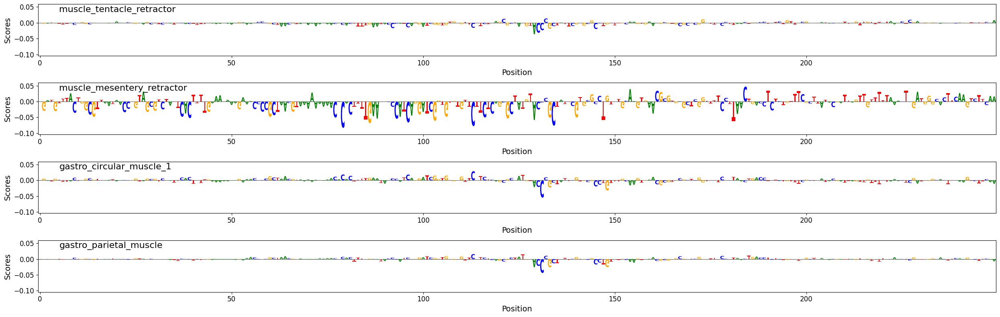

2025-02-24T13:54:32.050006+0100 INFO Plotting bar plots for region: NC_064035.1:3246866-3247366, models: ['model_500', 'model_500_ft']


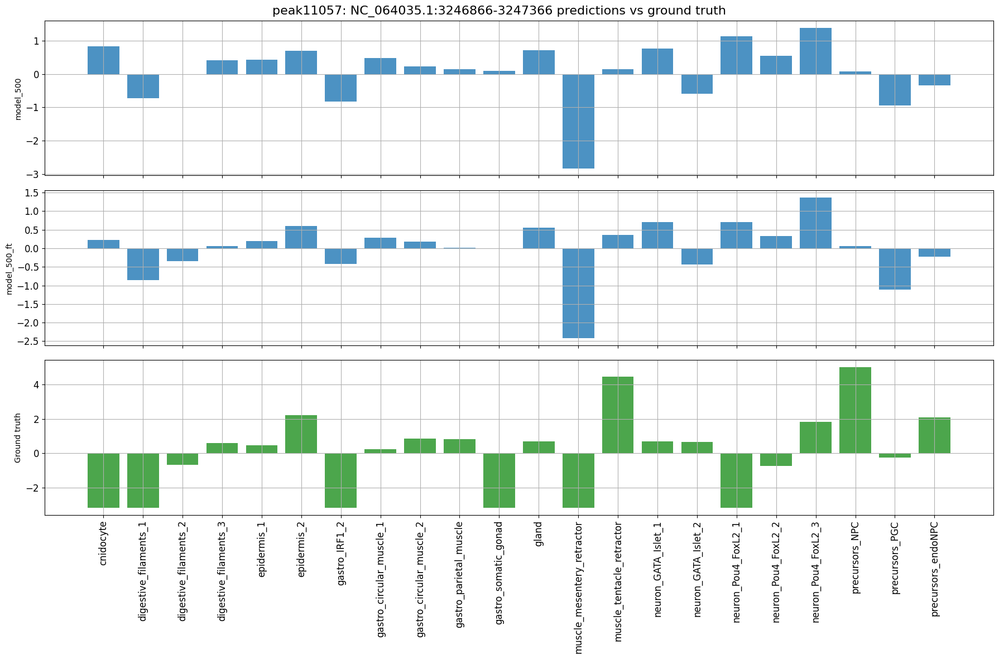

2025-02-24T13:54:33.057824+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


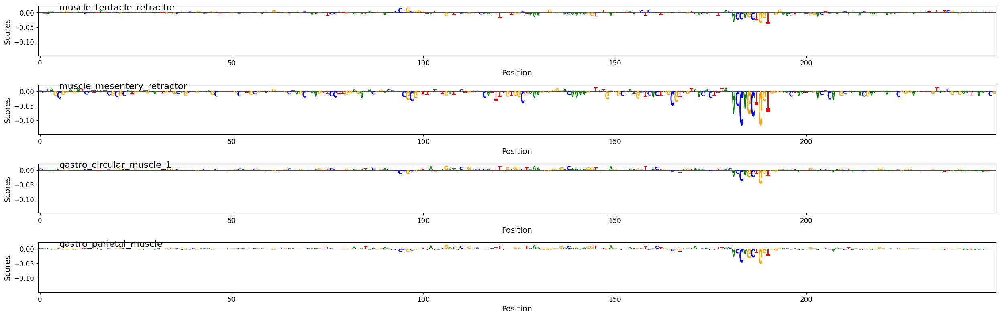

2025-02-24T13:54:40.558938+0100 INFO Plotting bar plots for region: NC_064035.1:3246866-3247366, models: ['model_500', 'model_500_ft']


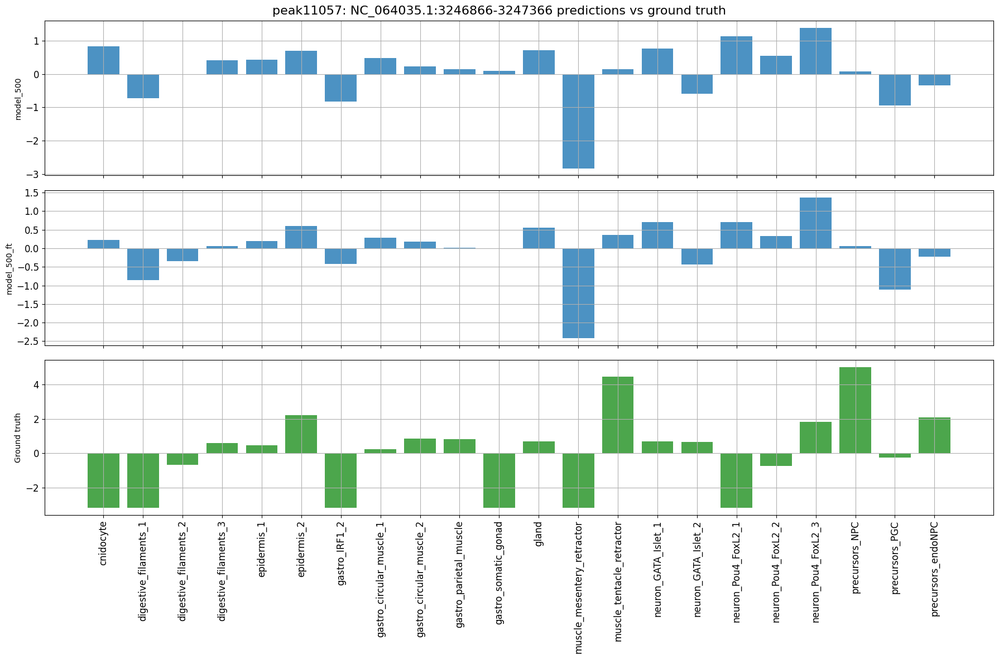

2025-02-24T13:54:41.208059+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
%matplotlib inline

import os

regions_of_interest = overlapping_regions["region_id"].tolist()

for region in regions_of_interest:
    
    # Peak id
    peak = overlapping_regions[overlapping_regions["region_id"] == region]["peak"].values[0]
    
    # Plot prediction vs ground truth for all cell types
    crested.pl.bar.region_predictions(
        adata, region,
        share_y=False, 
        x_label_rotation=90,
        title=f"{peak}: {region} predictions vs ground truth",
        save_path = os.path.join(plot_dir, f"{gene_name}-prediction.pdf")
    )

    # Calculate importance scores for selected cell types
    scores, one_hot_encoded_sequence = crested.tl.contribution_scores(
        region,
        target_idx=class_idx,
        model=model,
    )

    # Plot importance scores
    crested.pl.patterns.contribution_scores(
        scores,
        one_hot_encoded_sequence,
        class_labels=classes_of_interest,
        zoom_n_bases=250,
        save_path = os.path.join(plot_dir, f"{gene_name}-{peak}-importance.pdf")
    )

#### 2) MR muscle speific Nem24 and Nem7

Nem24 and Nem7 are bHLH paralogs that have been shown to be specifically expressed and accessible in mesentery retractor (MR) muscle.

First we look at model prediction on these gene loci.

In [ ]:
%matplotlib inline

gene = "Nvec_vc1.1_XM_032385184.2"
gene_name = "Nem24"
chrom = "NC_064035.1"
start = 3194045
end = 3195631

cell_type = "muscle_mesentery_retractor"
class_idx = list(adata.obs_names).index(cell_type)

upstream=5000
downstream=5000

strand= '-'

scores, coordinates, min_loc, max_loc, tss_position = crested.tl.score_gene_locus(
    chr_name=chrom,
    gene_start=start,
    gene_end=end,
    target_idx=class_idx,
    model=model,
    strand=strand,
    upstream=upstream,
    downstream=downstream,
    step_size=1,
)

bigwig = "results/CREsted/bw/"+cell_type+".bw"

values = crested.utils.read_bigwig_region(bigwig, (chrom,start-upstream,end+downstream)) if strand =='+' else crested.utils.read_bigwig_region(bigwig, (chrom,start-downstream,end+upstream))
bw_values=values[0]
midpoints=values[1]

crested.pl.hist.locus_scoring(
    scores,
    (min_loc, max_loc),
    gene_start=start,
    gene_end=end,
    title=f"CREsted prediction around {gene_name} gene locus for {cell_type}",
    bigwig_values=bw_values,
    bigwig_midpoints=midpoints,
    grid=False,
    figsize=(20,5),
    marker_size=2,
    line_width=1,
    save_path = os.path.join(plot_dir, f"{gene_name}-prediction-{cell_type}-gene-locus.pdf")
)


In [ ]:
%matplotlib inline

gene = "Nvec_vc1.1_XM_032385185.2"
gene_name = "Nem7"
chrom = "NC_064035.1"
start = 3197108
end = 3199731

cell_type = "muscle_mesentery_retractor"
class_idx = list(adata.obs_names).index(cell_type)

upstream=5000
downstream=5000

strand= '-'

scores, coordinates, min_loc, max_loc, tss_position = crested.tl.score_gene_locus(
    chr_name=chrom,
    gene_start=start,
    gene_end=end,
    target_idx=class_idx,
    model=model,
    strand=strand,
    upstream=upstream,
    downstream=downstream,
    step_size=1,
)

bigwig = "results/CREsted/bw/"+cell_type+".bw"

values = crested.utils.read_bigwig_region(bigwig, (chrom,start-upstream,end+downstream)) if strand =='+' else crested.utils.read_bigwig_region(bigwig, (chrom,start-downstream,end+upstream))
bw_values=values[0]
midpoints=values[1]

crested.pl.hist.locus_scoring(
    scores,
    (min_loc, max_loc),
    gene_start=start,
    gene_end=end,
    title=f"CREsted prediction around {gene_name} gene locus for {cell_type}",
    bigwig_values=bw_values,
    bigwig_midpoints=midpoints,
    grid=False,
    figsize=(20,5),
    marker_size=2,
    line_width=1,
    save_path = os.path.join(plot_dir, f"{gene_name}-prediction-{cell_type}-gene-locus.pdf")
)


Next, we will calculate contribution scores for peaks around this gene. First we identify regions that have been assigned to the gene.

In [ ]:
import pandas as pd

# Load region-to-gene assignment and preprocess
asgn = pd.read_csv("results/CREsted/Peaks_cell_type_mapped_gene_assignment_coaccess.tsv.gz", sep="\t")
gasn = asgn.loc[asgn["gene"] == gene, :].copy()
gasn["mid"] = (gasn["start"] + gasn["end"]) / 2
gasn.rename(columns={gasn.columns[0]: "chr"}, inplace=True)

# Compute midpoints for model regions
adata.var["mid"] = (adata.var["start"] + adata.var["end"]) / 2

# Ensure chromosome names match types
gasn["chr"] = gasn["chr"].astype(str)
adata.var["chr"] = adata.var["chr"].astype(str)

# Merge and find overlaps
merged = adata.var.merge(gasn, on="chr", suffixes=("_model", "_gasn"))
overlapping_regions = merged[
    (merged["start_model"] <= merged["end_gasn"]) & 
    (merged["end_model"] >= merged["start_gasn"])
].copy()

# Create region identifiers
overlapping_regions["region_id"] = overlapping_regions.apply(
    lambda row: f"{row['chr']}:{row['start_model']}-{row['end_model']}", axis=1
)

# Cell types we want to show
classes_of_interest = ["muscle_tentacle_retractor", "muscle_mesentery_retractor", "gastro_circular_muscle_1", "gastro_parietal_muscle"]
class_idx = list(adata.obs_names.get_indexer(classes_of_interest))


NC_064035.1:3192882-3193132 is not among the regions used for model training
NC_064035.1:3193610-3193860 is not among the regions used for model training
NC_064035.1:3193864-3194114 is not among the regions used for model training
NC_064035.1:3194726-3194976 is not among the regions used for model training
NC_064035.1:3195551-3195801 is not among the regions used for model training
NC_064035.1:3196307-3196557 is not among the regions used for model training
NC_064035.1:3196307-3196557 is not among the regions used for model training
NC_064035.1:3199441-3199691 is not among the regions used for model training
NC_064035.1:3200628-3200878 is not among the regions used for model training
NC_064035.1:3201312-3201562 is not among the regions used for model training
NC_064035.1:3201969-3202219 is not among the regions used for model training


/tmp/6996090/ipykernel_3064971/3192709212.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gasn["region_id"] = regions_of_interest_all


In [29]:
%matplotlib inline

import os

for region in regions_of_interest:
    # Peak id
    peak = gasn[gasn["region_id"] == region]["peak"].values[0]
    
    # Plot prediction vs ground truth for all cell types
    crested.pl.bar.region_predictions(
        adata, region,
        share_y=False, 
        x_label_rotation=90,
        title=f"{peak}: {region} predictions vs ground truth",
        save_path = os.path.join(plot_dir, f"{gene_name}-prediction.pdf")
    )

    # Calculate importance scores for selected cell types
    scores, one_hot_encoded_sequence = crested.tl.contribution_scores(
        region,
        target_idx=class_idx,
        model=model,
    )

    # Plot importance scores
    crested.pl.patterns.contribution_scores(
        scores,
        one_hot_encoded_sequence,
        class_labels=classes_of_interest,
        zoom_n_bases=250,
        save_path = os.path.join(plot_dir, f"{gene_name}-{peak}-importance.pdf")
    )

#### 3) SRPX2

Gene is accessible in both retractor muscles but have distinct accessible regions

In [ ]:
gene = "Nvec_vc1.1_XM_001636908.3"
gene_name = "MyHC-st"
chrom = "NC_064045.1"
start = 3405754
end = 3427835

In [152]:
gene = "Nvec_vc1.1_XM_032365556.2"
gene_name = "SRPX2"
chrom = "NC_064034.1"
start = 7850286
end = 7886094

1424/1424 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step


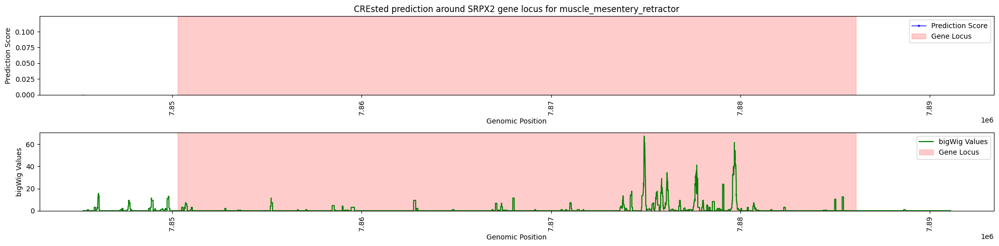

1424/1424 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step


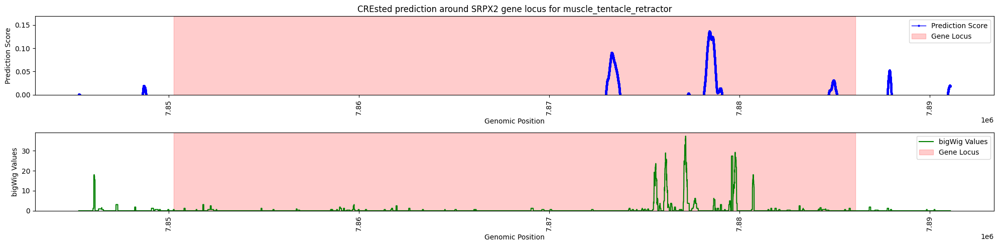

In [ ]:
%matplotlib inline

cell_types = ["muscle_mesentery_retractor", "muscle_tentacle_retractor"]

for cell_type in cell_types:
        
    class_idx = list(adata.obs_names).index(cell_type)
    
    upstream=5000
    downstream=5000
    
    strand= '-'
    
    scores, coordinates, min_loc, max_loc, tss_position = crested.tl.score_gene_locus(
        chr_name=chrom,
        gene_start=start,
        gene_end=end,
        target_idx=class_idx,
        model=model,
        strand=strand,
        upstream=upstream,
        downstream=downstream,
        step_size=1,
    )
    
    bigwig = "results/CREsted/bw/"+cell_type+".bw"
    
    values = crested.utils.read_bigwig_region(bigwig, (chrom,start-upstream,end+downstream)) if strand =='+' else crested.utils.read_bigwig_region(bigwig, (chrom,start-downstream,end+upstream))
    bw_values=values[0]
    midpoints=values[1]
    
    crested.pl.hist.locus_scoring(
        scores,
        (min_loc, max_loc),
        gene_start=start,
        gene_end=end,
        title=f"CREsted prediction around {gene_name} gene locus for {cell_type}",
        bigwig_values=bw_values,
        bigwig_midpoints=midpoints,
        grid=False,
        figsize=(20,5),
        marker_size=2,
        line_width=1,
        save_path = os.path.join(plot_dir, f"{gene_name}-prediction-{cell_type}-gene-locus.pdf")
    )


In [ ]:
import pandas as pd

# Region-to-gene assignment
asgn = pd.read_csv("results/CREsted/Peaks_cell_type_mapped_gene_assignment_coaccess.tsv.gz", sep="\t")
gasn = asgn[asgn["gene"] == gene]

# Regions we want to show
regions_of_interest_all = [f"{a[0]}:{a[1]}-{a[2]}" for a in zip(gasn["seqnames"], gasn["start"], gasn["end"])]
gasn["region_id"] = regions_of_interest_all
regions_of_interest = []
regions_model = adata.var.index.values.tolist()
for rg in regions_of_interest_all:
    if rg in regions_model:
        if rg in regions_of_interest:
            next
        else: 
            regions_of_interest.append(rg)
    else:
        print(f"{rg} is not among the regions used for model training")

# Cell types we want to show
classes_of_interest = ["muscle_tentacle_retractor", "muscle_mesentery_retractor", "gastro_circular_muscle_1", "gastro_parietal_muscle"]
class_idx = list(adata.obs_names.get_indexer(classes_of_interest))


NC_064034.1:7847568-7847817 is not among the regions used for model training
NC_064034.1:7851308-7851558 is not among the regions used for model training
NC_064034.1:7858162-7858411 is not among the regions used for model training
NC_064034.1:7863129-7863379 is not among the regions used for model training
NC_064034.1:7870879-7871129 is not among the regions used for model training
NC_064034.1:7876014-7876264 is not among the regions used for model training
NC_064034.1:7876014-7876264 is not among the regions used for model training
NC_064034.1:7877537-7877787 is not among the regions used for model training
NC_064034.1:7878780-7879030 is not among the regions used for model training
NC_064034.1:7879222-7879472 is not among the regions used for model training
NC_064034.1:7879559-7879809 is not among the regions used for model training
NC_064034.1:7879899-7880149 is not among the regions used for model training
NC_064034.1:7880626-7880876 is not among the regions used for model training

/tmp/6974707/ipykernel_2865428/593310579.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gasn["region_id"] = regions_of_interest_all


2025-02-23T18:12:37.460992+0100 INFO Plotting bar plots for region: NC_064034.1:7877048-7877298, models: ['model_250', 'model_250_ft']


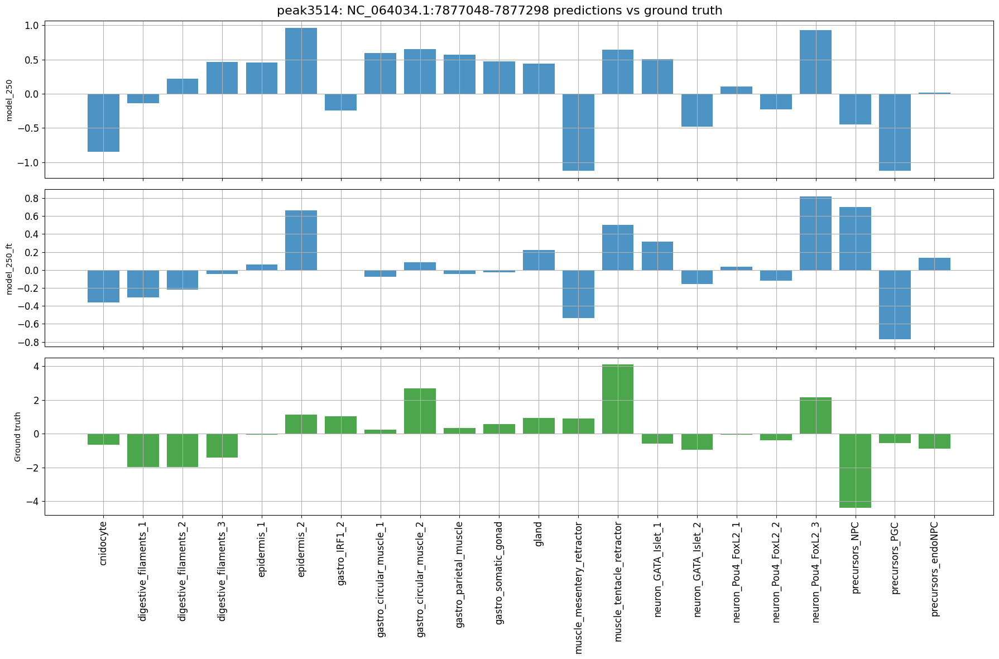

2025-02-23T18:12:38.094537+0100 INFO Calculating contribution scores for 4 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:01<00:00,  1.53s/it]


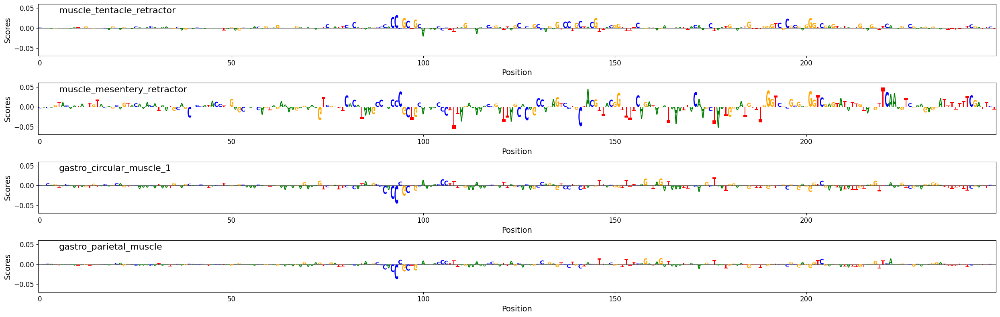

In [154]:
%matplotlib inline

import os

for region in regions_of_interest:
    # Peak id
    peak = gasn[gasn["region_id"] == region]["peak"].values[0]
    
    # Plot prediction vs ground truth for all cell types
    crested.pl.bar.region_predictions(
        adata, region,
        share_y=False, 
        x_label_rotation=90,
        title=f"{peak}: {region} predictions vs ground truth",
        save_path = os.path.join(plot_dir, f"{gene_name}-prediction.pdf")
    )

    # Calculate importance scores for selected cell types
    scores, one_hot_encoded_sequence = crested.tl.contribution_scores(
        region,
        target_idx=class_idx,
        model=model,
    )

    # Plot importance scores
    crested.pl.patterns.contribution_scores(
        scores,
        one_hot_encoded_sequence,
        class_labels=classes_of_interest,
        zoom_n_bases=250,
        save_path = os.path.join(plot_dir, f"{gene_name}-{peak}-importance.pdf")
    )

## Example cnidocyte regions

Here we inspect contributions in regions assigned to cnidocyte specific genes.

In [155]:
gene = "Nvec_vc1.1_XM_032363992.2"
gene_name = "Pou4"
chrom = "NC_064043.1"
start = 10393144
end = 10395554

cell_type = "neuron_Pou4_FoxL2_2"
class_idx = list(adata.obs_names).index(cell_type)

upstream=5000
downstream=5000

strand= '-'

scores, coordinates, min_loc, max_loc, tss_position = crested.tl.score_gene_locus(
    chr_name=chrom,
    gene_start=start,
    gene_end=end,
    target_idx=class_idx,
    model=model,
    strand=strand,
    upstream=upstream,
    downstream=downstream,
    step_size=1,
)

381/381 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


In [156]:
bigwig = "data/bw/"+cell_type+".bw"

values = crested.utils.read_bigwig_region(bigwig, (chrom,start-upstream,end+downstream)) if strand =='+' else crested.utils.read_bigwig_region(bigwig, (chrom,start-downstream,end+upstream))
bw_values=values[0]
midpoints=values[1]

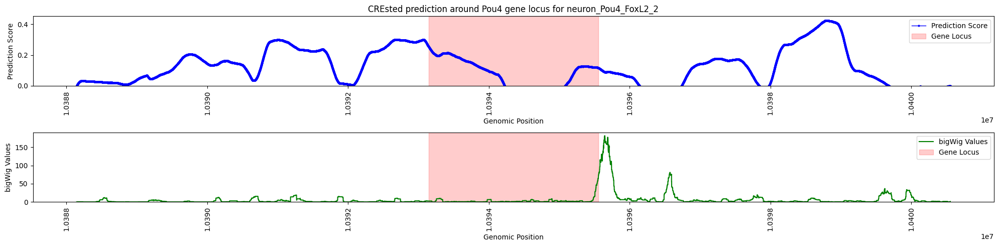

In [157]:
%matplotlib inline
crested.pl.hist.locus_scoring(
    scores,
    (min_loc, max_loc),
    gene_start=start,
    gene_end=end,
    title=f"CREsted prediction around {gene_name} gene locus for {cell_type}",
    bigwig_values=bw_values,
    bigwig_midpoints=midpoints,
    grid=False,
    figsize=(20,5),
    marker_size=2,
    line_width=1,
)

In [ ]:
import pandas as pd

# Load region-to-gene assignment and preprocess
asgn = pd.read_csv("results/CREsted/Peaks_cell_type_mapped_gene_assignment_coaccess.tsv.gz", sep="\t")
gasn = asgn.loc[asgn["gene"] == gene, :].copy()
gasn["mid"] = (gasn["start"] + gasn["end"]) / 2
gasn.rename(columns={gasn.columns[0]: "chr"}, inplace=True)

# Compute midpoints for model regions
adata.var["mid"] = (adata.var["start"] + adata.var["end"]) / 2

# Ensure chromosome names match types
gasn["chr"] = gasn["chr"].astype(str)
adata.var["chr"] = adata.var["chr"].astype(str)

# Merge and find overlaps
merged = adata.var.merge(gasn, on="chr", suffixes=("_model", "_gasn"))
overlapping_regions = merged[
    (merged["start_model"] <= merged["end_gasn"]) & 
    (merged["end_model"] >= merged["start_gasn"])
].copy()

# Create region identifiers
overlapping_regions["region_id"] = overlapping_regions.apply(
    lambda row: f"{row['chr']}:{row['start_model']}-{row['end_model']}", axis=1
)

# Cell types we want to show
classes_of_interest = ["cnidocyte", "neuron_GATA_Islet_1", "neuron_GATA_Islet_2", "neuron_Pou4_FoxL2_1", "neuron_Pou4_FoxL2_2", "neuron_Pou4_FoxL2_3"]
class_idx = list(adata.obs_names.get_indexer(classes_of_interest))


NC_064043.1:10375857-10376107 is not among the regions used for model training
NC_064043.1:10376080-10376329 is not among the regions used for model training
NC_064043.1:10376294-10376544 is not among the regions used for model training
NC_064043.1:10377014-10377263 is not among the regions used for model training
NC_064043.1:10381837-10382086 is not among the regions used for model training
NC_064043.1:10386268-10386518 is not among the regions used for model training
NC_064043.1:10389999-10390249 is not among the regions used for model training
NC_064043.1:10391117-10391367 is not among the regions used for model training
NC_064043.1:10391790-10392040 is not among the regions used for model training
NC_064043.1:10391790-10392040 is not among the regions used for model training
NC_064043.1:10392053-10392303 is not among the regions used for model training
NC_064043.1:10392566-10392816 is not among the regions used for model training
NC_064043.1:10392566-10392816 is not among the regio

/tmp/6974707/ipykernel_2865428/3493825725.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  gasn["region_id"] = regions_of_interest_all


2025-02-23T18:14:59.302748+0100 INFO Plotting bar plots for region: NC_064043.1:10382045-10382295, models: ['model_250', 'model_250_ft']


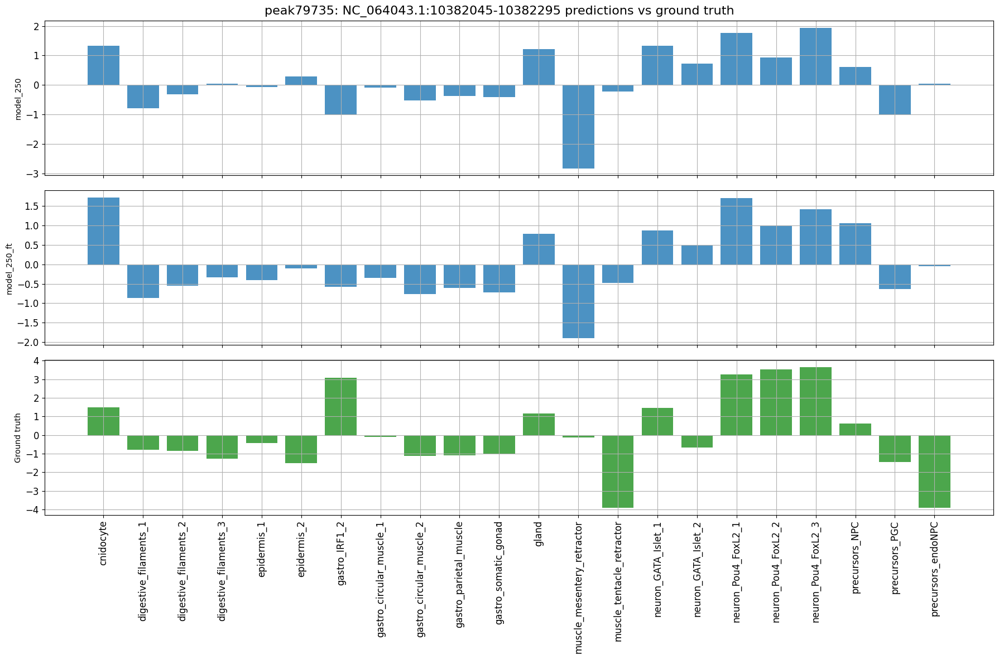

2025-02-23T18:14:59.899161+0100 INFO Calculating contribution scores for 6 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


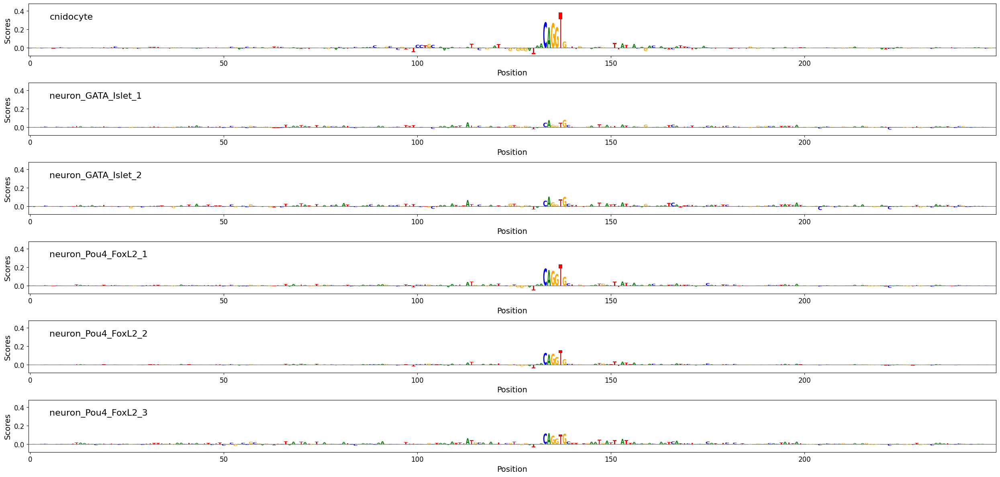

2025-02-23T18:15:09.320460+0100 INFO Plotting bar plots for region: NC_064043.1:10387457-10387707, models: ['model_250', 'model_250_ft']


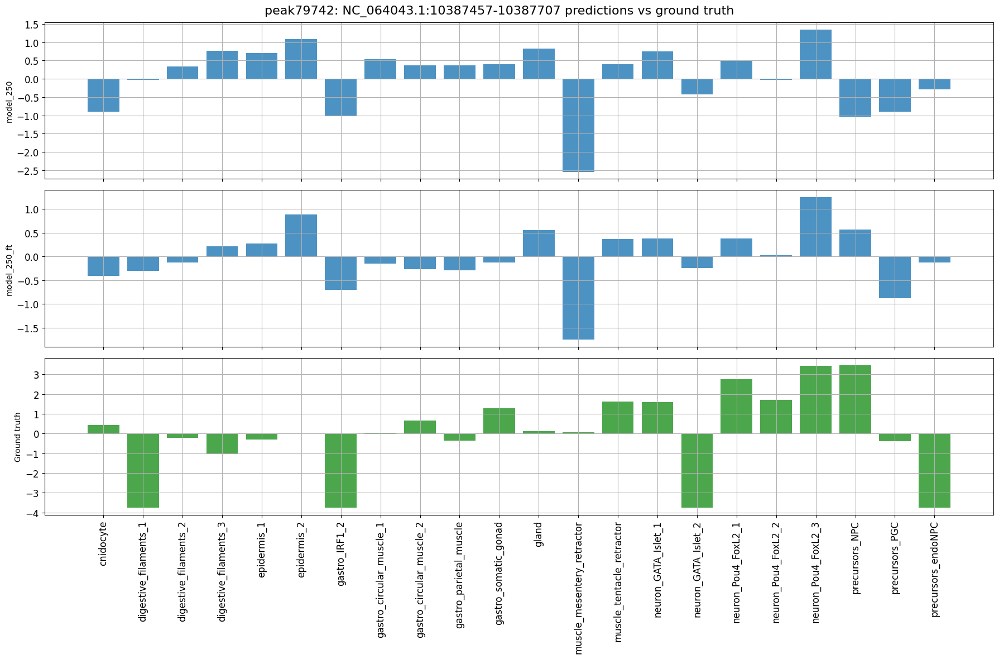

2025-02-23T18:15:09.905562+0100 INFO Calculating contribution scores for 6 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


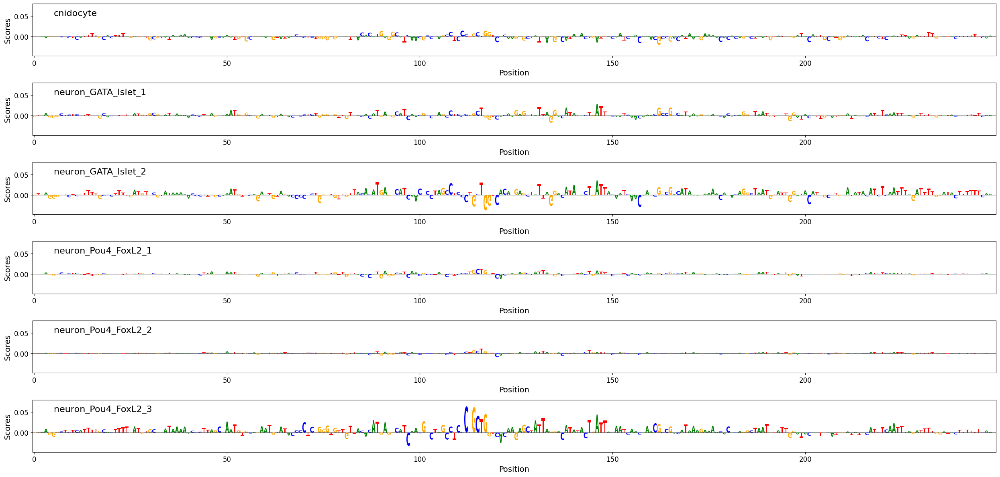

2025-02-23T18:15:19.562266+0100 INFO Plotting bar plots for region: NC_064043.1:10388445-10388695, models: ['model_250', 'model_250_ft']


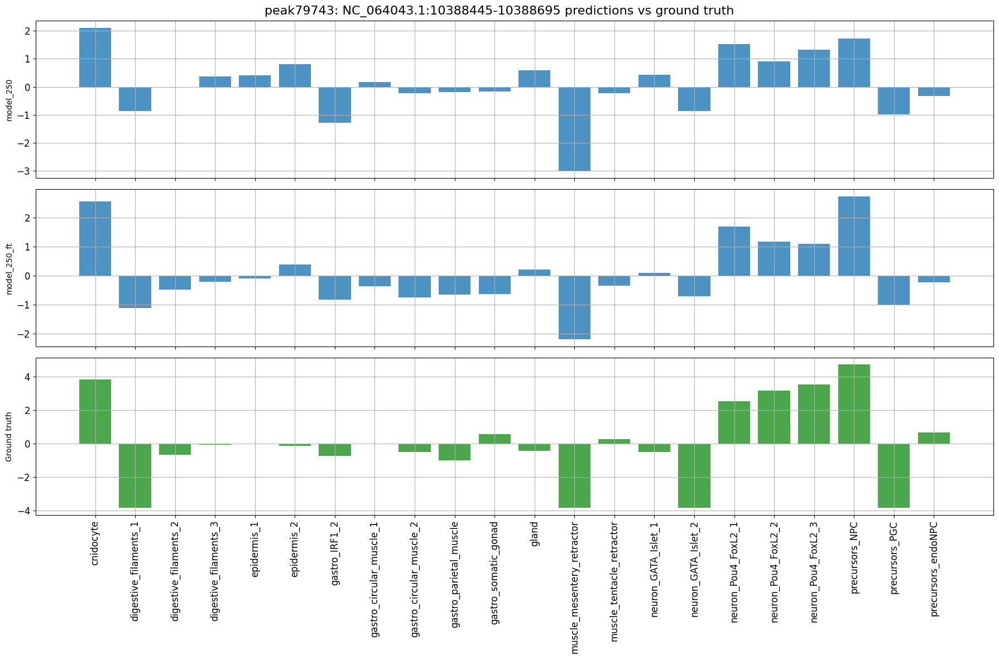

2025-02-23T18:15:20.169366+0100 INFO Calculating contribution scores for 6 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


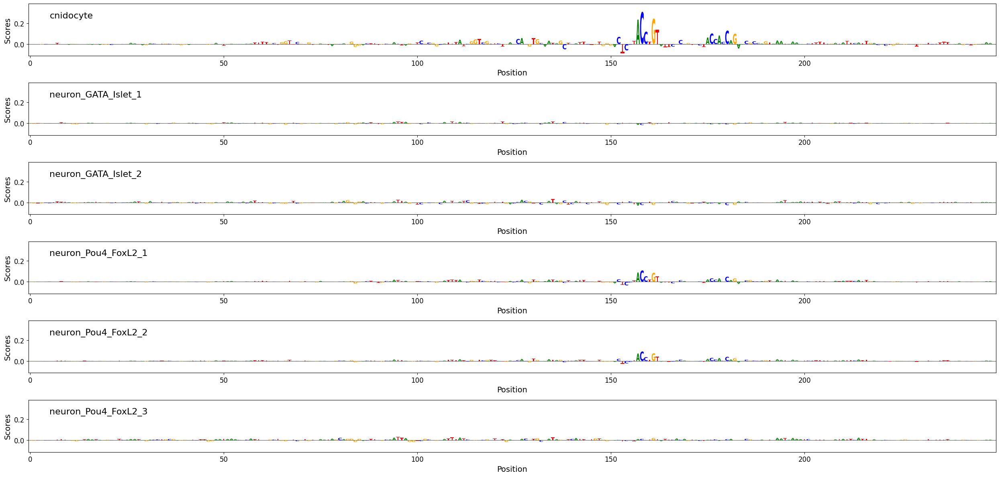

2025-02-23T18:15:29.420093+0100 INFO Plotting bar plots for region: NC_064043.1:10389005-10389255, models: ['model_250', 'model_250_ft']


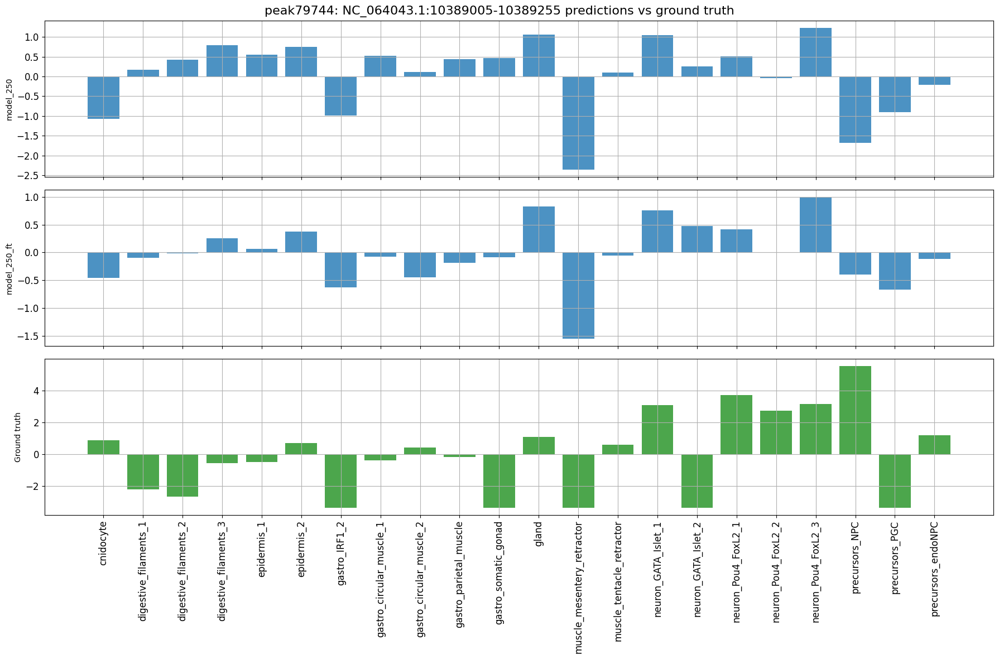

2025-02-23T18:15:30.525899+0100 INFO Calculating contribution scores for 6 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


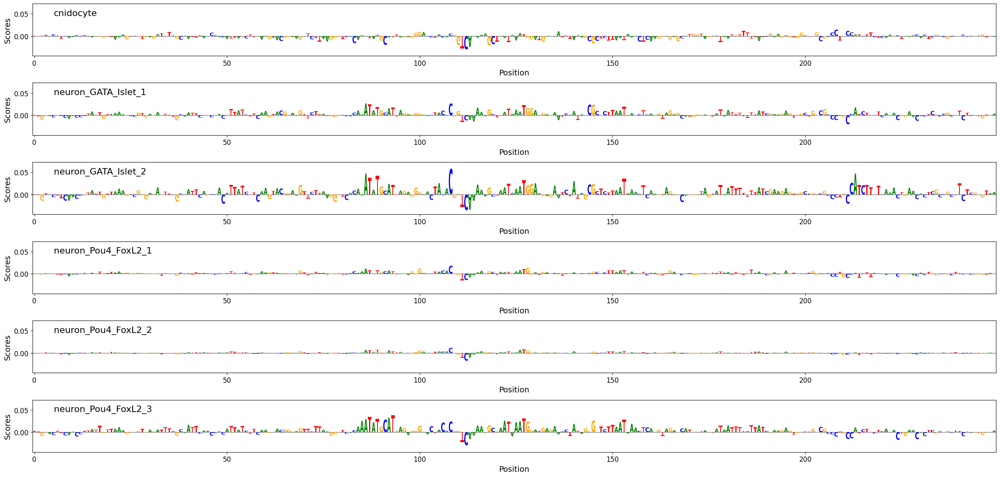

2025-02-23T18:15:39.629876+0100 INFO Plotting bar plots for region: NC_064043.1:10390541-10390791, models: ['model_250', 'model_250_ft']


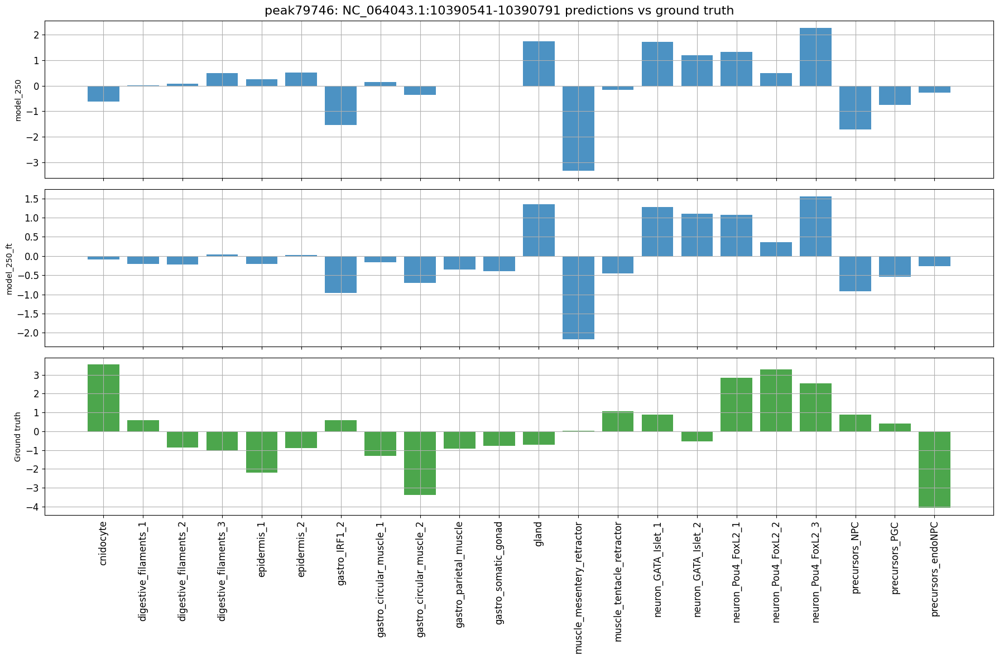

2025-02-23T18:15:40.261798+0100 INFO Calculating contribution scores for 6 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


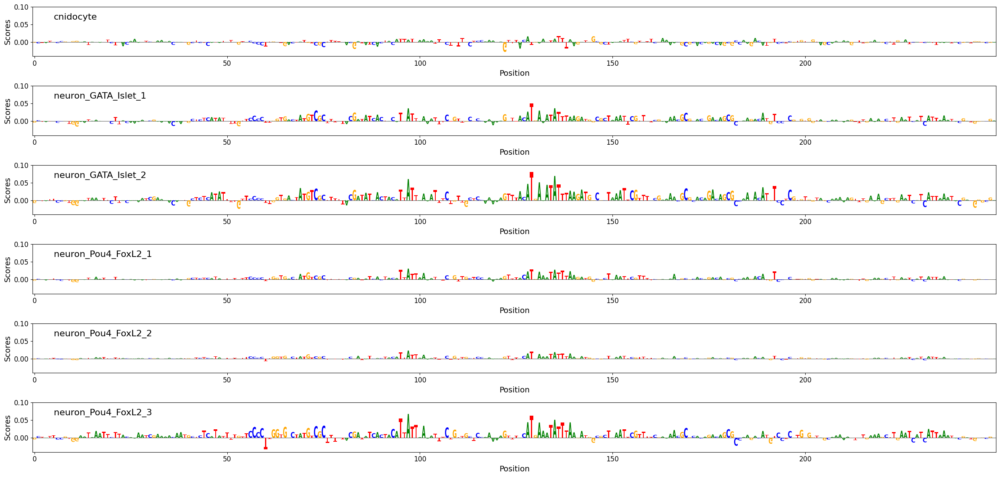

2025-02-23T18:15:48.808153+0100 INFO Plotting bar plots for region: NC_064043.1:10396446-10396696, models: ['model_250', 'model_250_ft']


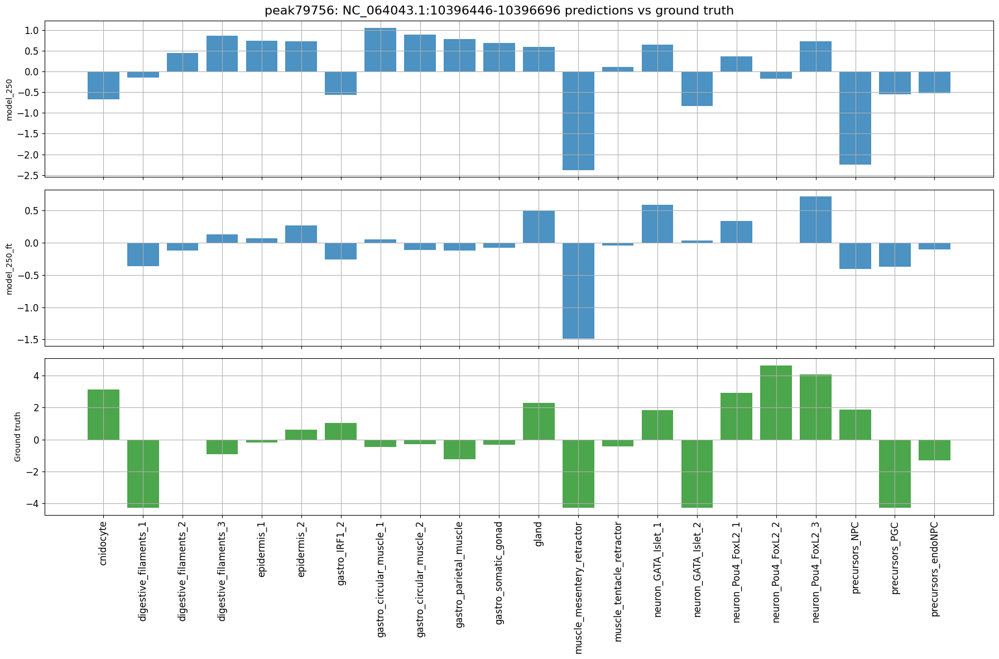

2025-02-23T18:15:49.429616+0100 INFO Calculating contribution scores for 6 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


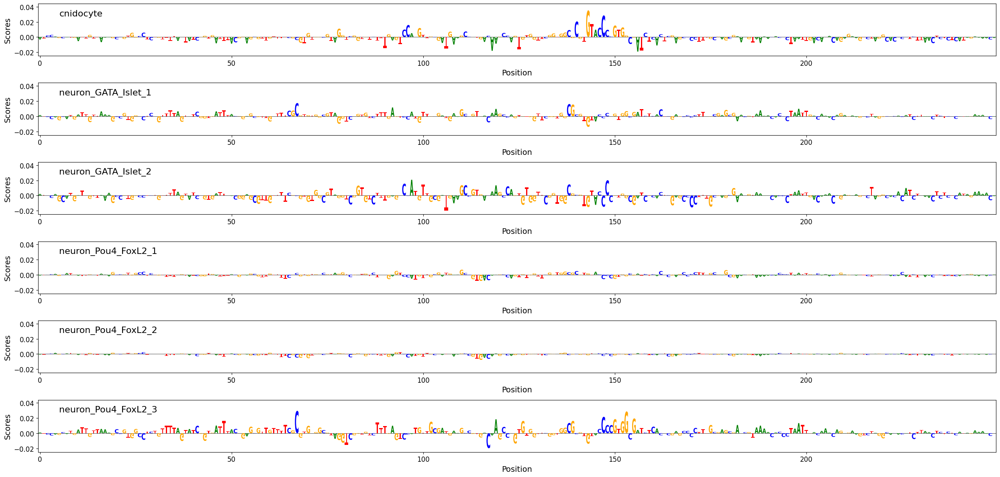

2025-02-23T18:15:59.754976+0100 INFO Plotting bar plots for region: NC_064043.1:10397175-10397425, models: ['model_250', 'model_250_ft']


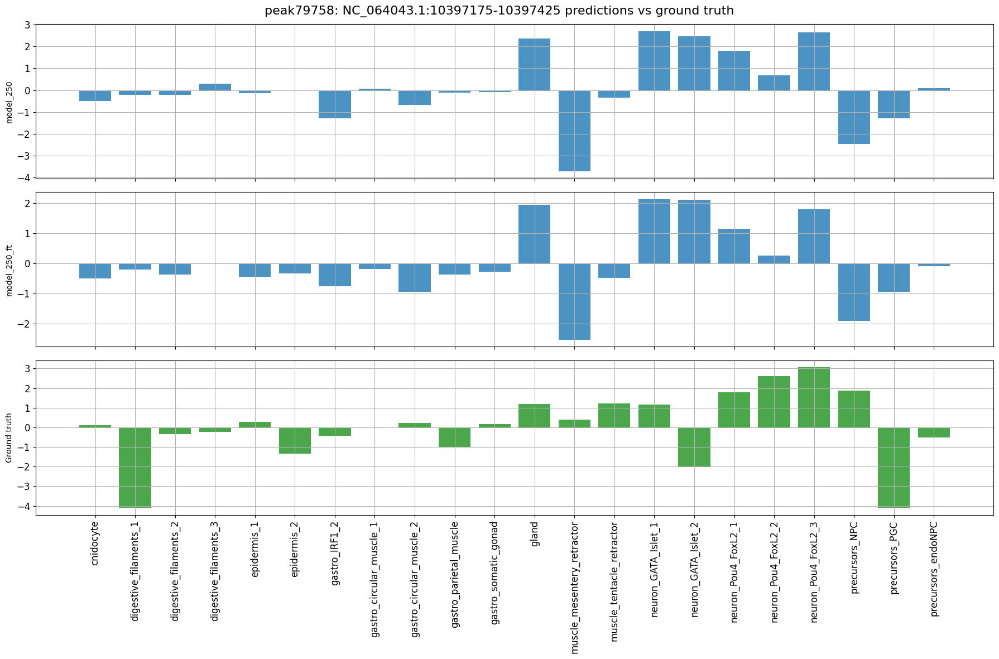

2025-02-23T18:16:00.370647+0100 INFO Calculating contribution scores for 6 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


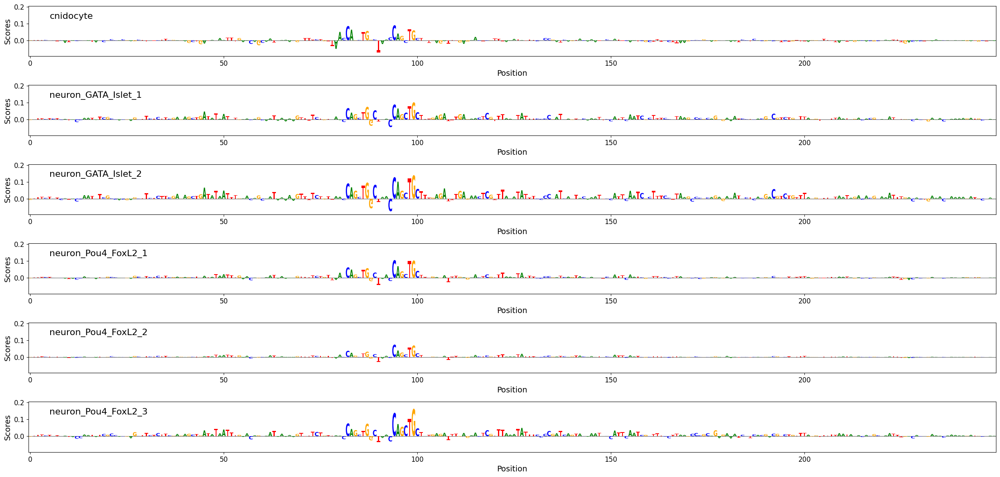

2025-02-23T18:16:09.383053+0100 INFO Plotting bar plots for region: NC_064043.1:10399502-10399752, models: ['model_250', 'model_250_ft']


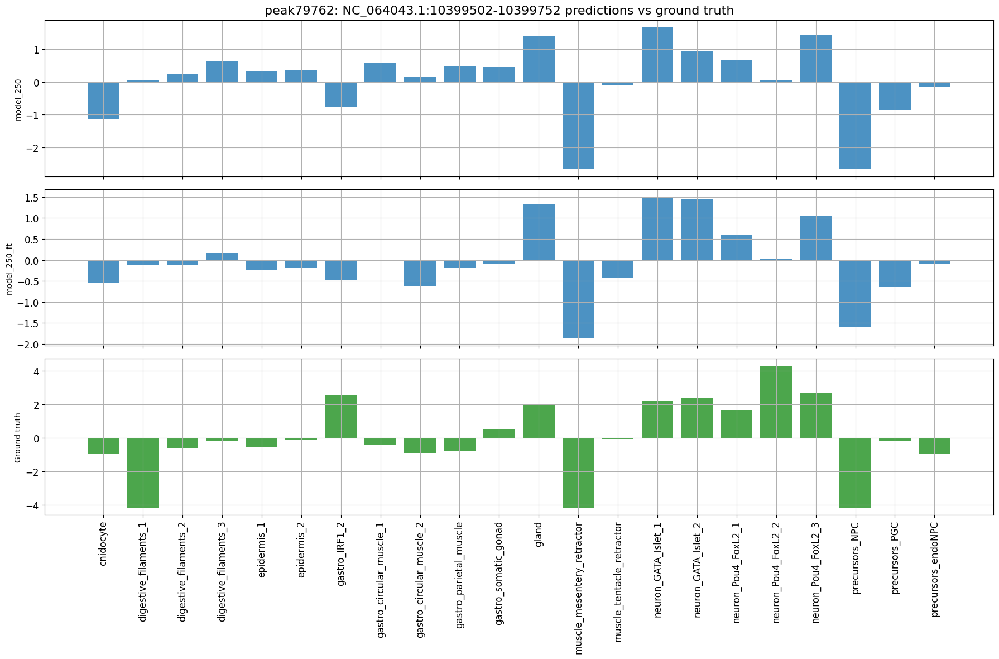

2025-02-23T18:16:09.950596+0100 INFO Calculating contribution scores for 6 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


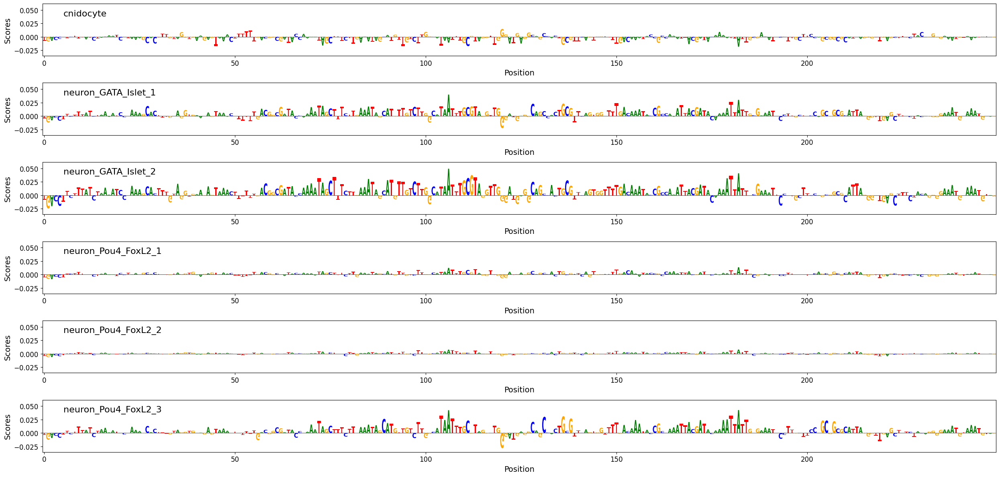

2025-02-23T18:16:19.511550+0100 INFO Plotting bar plots for region: NC_064043.1:10400577-10400827, models: ['model_250', 'model_250_ft']


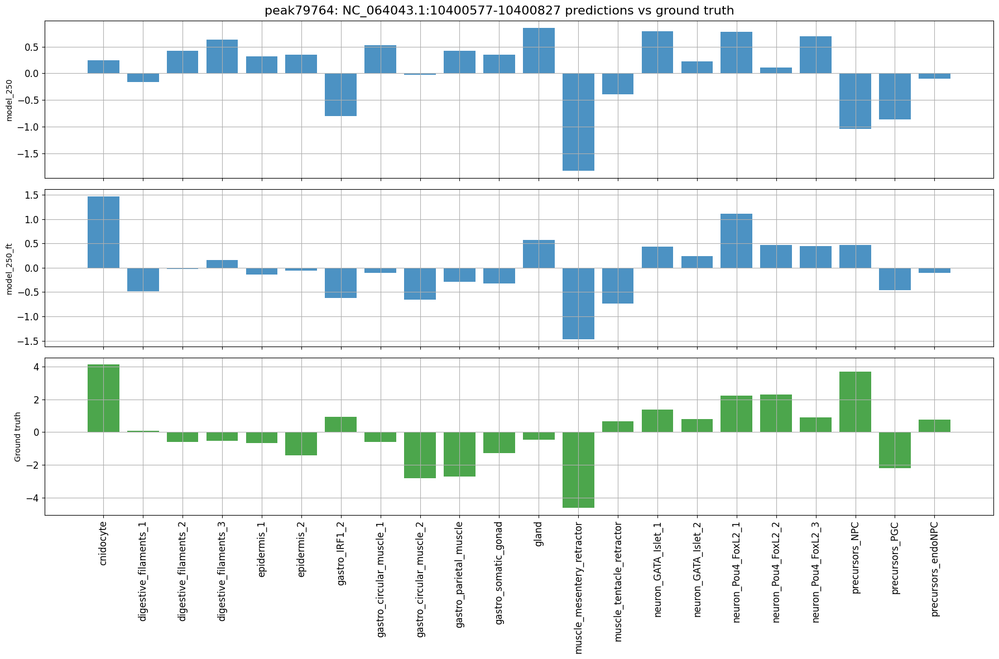

2025-02-23T18:16:20.129332+0100 INFO Calculating contribution scores for 6 class(es) and 1 region(s).


Model: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


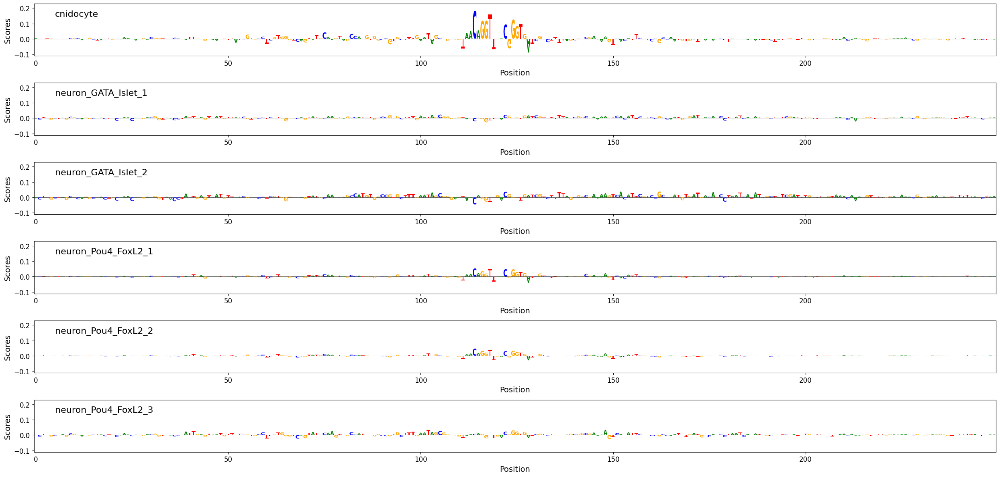

In [160]:
%matplotlib inline

import os

for region in regions_of_interest:
    # Peak id
    peak = gasn[gasn["region_id"] == region]["peak"].values[0]
    
    # Plot prediction vs ground truth for all cell types
    crested.pl.bar.region_predictions(
        adata, region,
        share_y=False, 
        x_label_rotation=90,
        title=f"{peak}: {region} predictions vs ground truth",
        save_path = os.path.join(plot_dir, f"{gene_name}-prediction.pdf")
    )

    # Calculate importance scores for selected cell types
    scores, one_hot_encoded_sequence = crested.tl.contribution_scores(
        region,
        target_idx=class_idx,
        model=model,
    )

    # Plot importance scores
    crested.pl.patterns.contribution_scores(
        scores,
        one_hot_encoded_sequence,
        class_labels=classes_of_interest,
        zoom_n_bases=250,
        save_path = os.path.join(plot_dir, f"{gene_name}-{peak}-importance.pdf")
    )
